In [1]:
!pip install opencv-python tensorflow plotly

  Using cached plotly-6.5.0-py3-none-any.whl.metadata (8.5 kB)
Using cached plotly-6.5.0-py3-none-any.whl (9.9 MB)

   ---------------------------------------- 0/2 [narwhals]
   ---------------------------------------- 0/2 [narwhals]
   ---------------------------------------- 0/2 [narwhals]
   -------------------- ------------------- 1/2 [plotly]
   -------------------- ------------------- 1/2 [plotly]
   -------------------- ------------------- 1/2 [plotly]
   -------------------- ------------------- 1/2 [plotly]
   -------------------- ------------------- 1/2 [plotly]
   -------------------- ------------------- 1/2 [plotly]
   -------------------- ------------------- 1/2 [plotly]
   -------------------- ------------------- 1/2 [plotly]
   -------------------- ------------------- 1/2 [plotly]
   -------------------- ------------------- 1/2 [plotly]
   -------------------- ------------------- 1/2 [plotly]
   -------------------- ------------------- 1/2 [plotly]
   --------------------

# Import Libraries

In [7]:
import os
import cv2
import numpy as np
import pandas as pd
import math
import matplotlib.pyplot as plt
import seaborn as sns
from mpl_toolkits.mplot3d import Axes3D
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Set matplotlib style
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")

In [3]:
# Machine Learning
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.metrics import (classification_report, confusion_matrix, 
                             accuracy_score, f1_score, precision_score, recall_score,
                             silhouette_score)

In [4]:
# ML Models
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LogisticRegression

In [5]:
# Deep Learning
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG16, ResNet50, MobileNetV2
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau, ModelCheckpoint

In [6]:
# Set random seeds
np.random.seed(42)
tf.random.set_seed(42)

# Data Loading and Preparation

In [8]:
def load_images_from_folder(folder_path, target_size=(224, 224)):
    """Load images from folder with preprocessing"""
    images = []
    for filename in os.listdir(folder_path):
        img_path = os.path.join(folder_path, filename)
        try:
            img = cv2.imread(img_path)
            if img is not None:
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                img = cv2.resize(img, target_size)
                images.append(img)
        except Exception as e:
            print(f"Error loading {filename}: {e}")
    return np.array(images)

In [9]:
def display_images(images, title, cols=10):
    rows = math.ceil(len(images) / cols)
    plt.figure(figsize=(20, 2 * rows))
    
    for i, img in enumerate(images):
        plt.subplot(rows, cols, i + 1)
        plt.imshow(img)
        plt.axis("off")
    
    plt.suptitle(title, fontsize=16)
    plt.tight_layout()
    plt.show()

In [10]:
base_path = "Data"

blb_images = load_images_from_folder(os.path.join(base_path, "Bacterial leaf blight"))
brown_spot_images = load_images_from_folder(os.path.join(base_path, "Brown spot"))
leaf_smut_images = load_images_from_folder(os.path.join(base_path, "Leaf smut"))

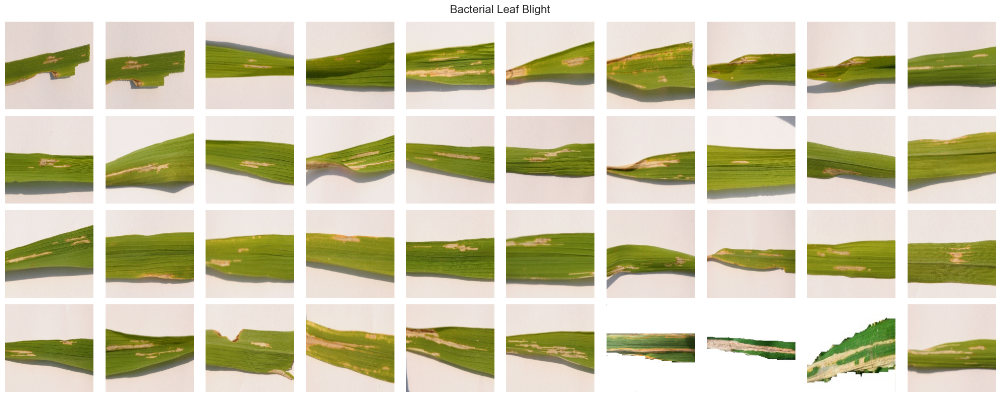

In [11]:
display_images(blb_images, "Bacterial Leaf Blight")

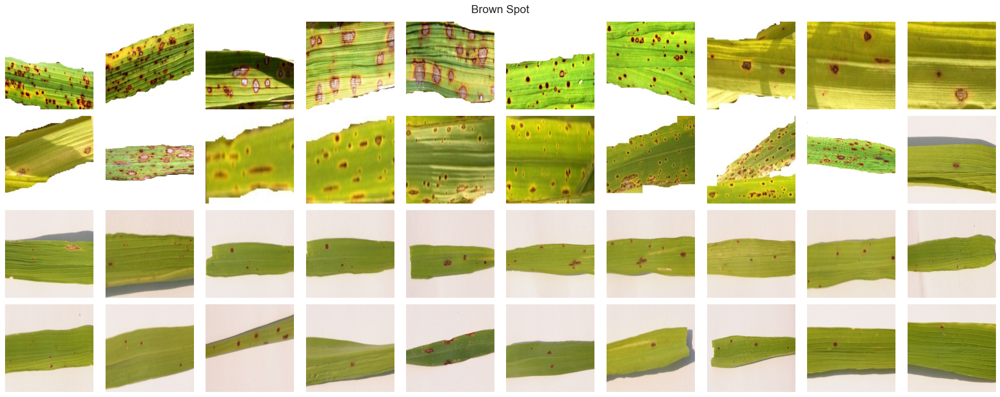

In [12]:
display_images(brown_spot_images, "Brown Spot")

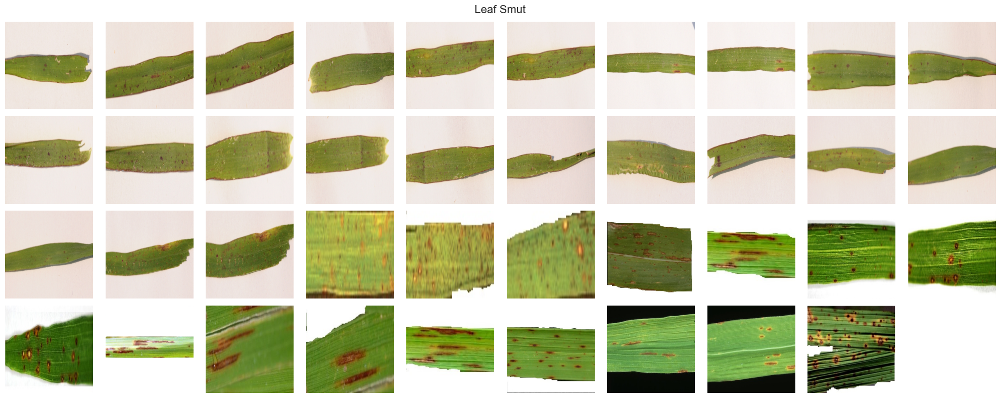

In [13]:
display_images(leaf_smut_images, "Leaf Smut")

In [14]:
print("Bacterial Leaf Blight:", len(blb_images))
print("Brown Spot:", len(brown_spot_images))
print("Leaf Smut:", len(leaf_smut_images))

Bacterial Leaf Blight: 40
Brown Spot: 40
Leaf Smut: 39


In [15]:
# %% Create Dataset
X = np.concatenate([blb_images, brown_spot_images, leaf_smut_images], axis=0)
y = np.array([0]*len(blb_images) + [1]*len(brown_spot_images) + [2]*len(leaf_smut_images))

In [16]:
class_names = ['Bacterial Leaf Blight', 'Brown Spot', 'Leaf Smut']
print(f"\nTotal images: {len(X)}")
print(f"Image shape: {X[0].shape}")


Total images: 119
Image shape: (224, 224, 3)


# Exploratory Data Analysis (EDA)

In [17]:
# %% Class Distribution
class_counts = pd.Series(y).value_counts().sort_index()
class_df = pd.DataFrame({
    'Class': class_names,
    'Count': class_counts.values
})

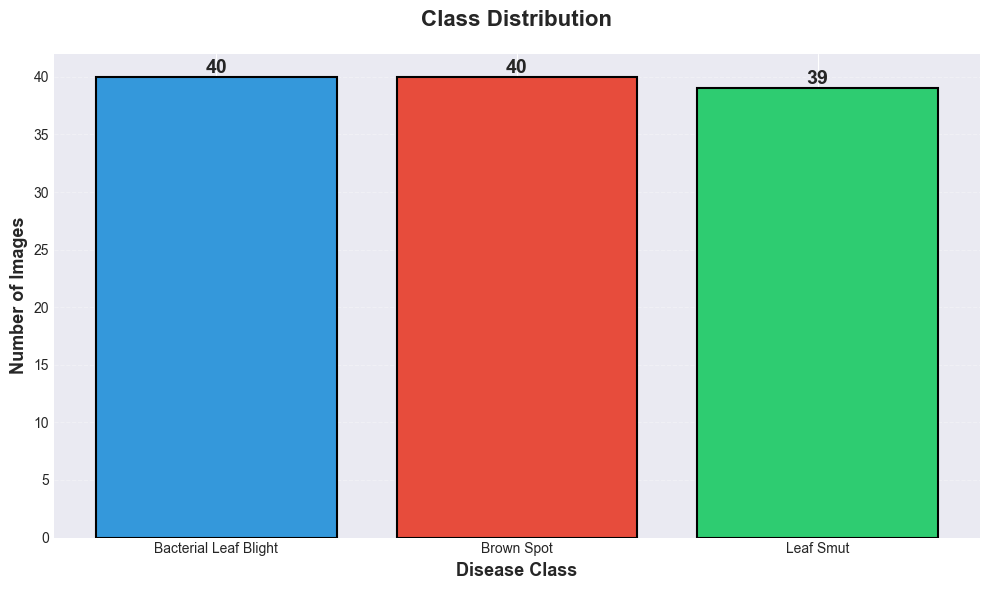

In [18]:
plt.figure(figsize=(10, 6))
bars = plt.bar(class_df['Class'], class_df['Count'], 
               color=['#3498db', '#e74c3c', '#2ecc71'], 
               edgecolor='black', linewidth=1.5)
plt.title('Class Distribution', fontsize=16, fontweight='bold', pad=20)
plt.xlabel('Disease Class', fontsize=13, fontweight='bold')
plt.ylabel('Number of Images', fontsize=13, fontweight='bold')
plt.grid(axis='y', alpha=0.3, linestyle='--')

for i, bar in enumerate(bars):
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2., height,
            f'{int(height)}', ha='center', va='bottom', 
            fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

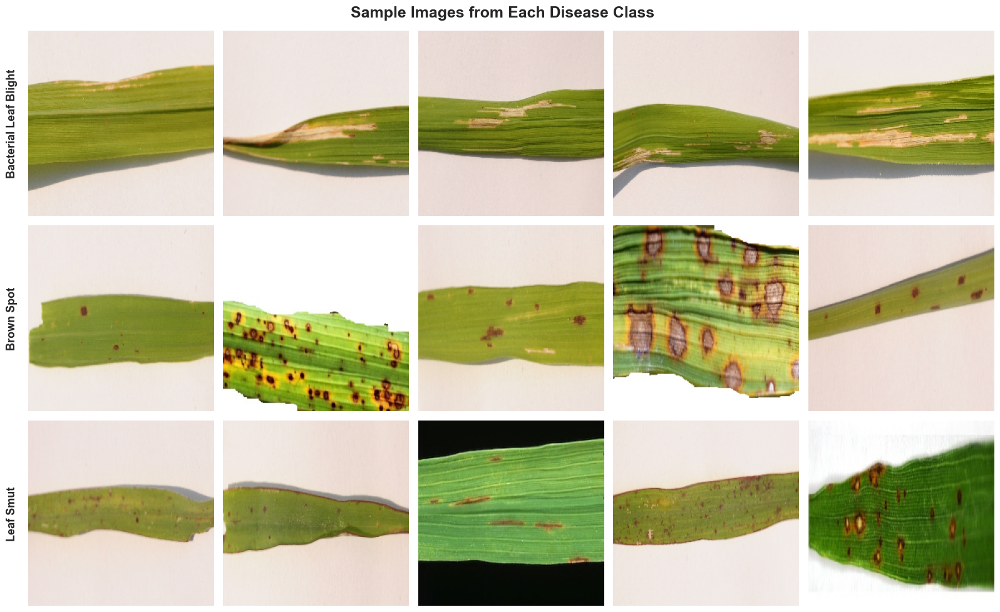

In [19]:
# Sample Images Visualization
fig, axes = plt.subplots(3, 5, figsize=(16, 10))
fig.suptitle('Sample Images from Each Disease Class', fontsize=18, fontweight='bold', y=0.98)

for i, (images, class_name) in enumerate(zip([blb_images, brown_spot_images, leaf_smut_images], 
                                               class_names)):
    indices = np.random.choice(len(images), 5, replace=False)
    for j, idx in enumerate(indices):
        axes[i, j].imshow(images[idx])
        axes[i, j].axis('off')
        if j == 0:
            axes[i, j].text(-20, images[idx].shape[0]//2, class_name, 
                          fontsize=13, fontweight='bold', rotation=90,
                          ha='center', va='center')

plt.tight_layout()
plt.show()

In [20]:
# Color Distribution Analysis
def analyze_color_distribution(images, class_name):
    """Analyze RGB color distribution"""
    r_mean = images[:, :, :, 0].mean(axis=(1, 2))
    g_mean = images[:, :, :, 1].mean(axis=(1, 2))
    b_mean = images[:, :, :, 2].mean(axis=(1, 2))
    
    return pd.DataFrame({
        'Red': r_mean,
        'Green': g_mean,
        'Blue': b_mean,
        'Class': class_name
    })

In [21]:
color_dfs = []
for images, class_name in zip([blb_images, brown_spot_images, leaf_smut_images], class_names):
    color_dfs.append(analyze_color_distribution(images, class_name))

color_df = pd.concat(color_dfs, ignore_index=True)

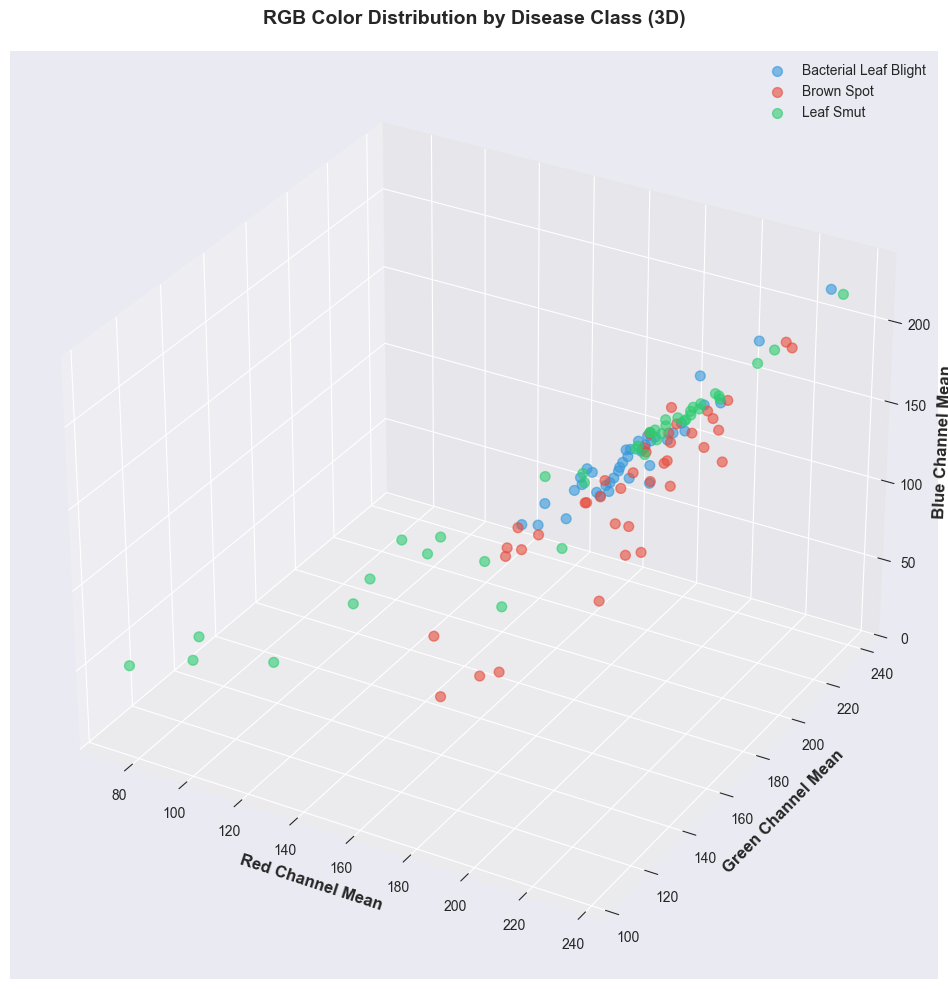

In [22]:
# 3D Scatter Plot
fig = plt.figure(figsize=(14, 10))
ax = fig.add_subplot(111, projection='3d')

colors_map = {'Bacterial Leaf Blight': '#3498db', 'Brown Spot': '#e74c3c', 'Leaf Smut': '#2ecc71'}

for class_name in class_names:
    class_data = color_df[color_df['Class'] == class_name]
    ax.scatter(class_data['Red'], class_data['Green'], class_data['Blue'],
              label=class_name, alpha=0.6, s=50, c=colors_map[class_name])

ax.set_xlabel('Red Channel Mean', fontsize=12, fontweight='bold')
ax.set_ylabel('Green Channel Mean', fontsize=12, fontweight='bold')
ax.set_zlabel('Blue Channel Mean', fontsize=12, fontweight='bold')
ax.set_title('RGB Color Distribution by Disease Class (3D)', fontsize=14, fontweight='bold', pad=20)
ax.legend(loc='upper right', fontsize=10)
plt.tight_layout()
plt.show()

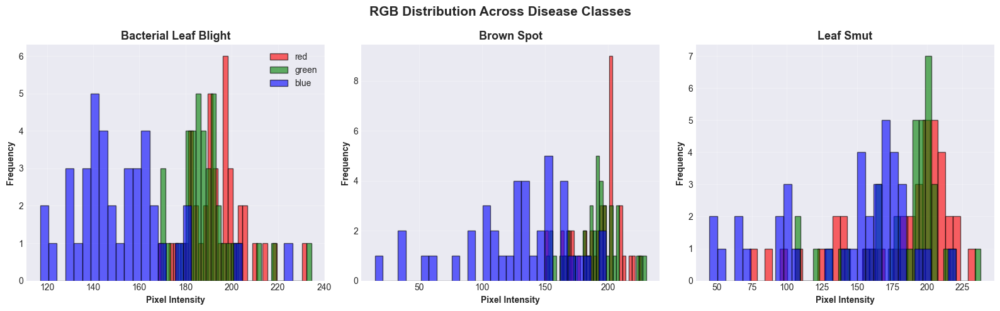

In [23]:
# RGB Histograms
fig, axes = plt.subplots(1, 3, figsize=(16, 5))
colors = ['red', 'green', 'blue']

for idx, class_name in enumerate(class_names):
    class_data = color_df[color_df['Class'] == class_name]
    for color in colors:
        axes[idx].hist(class_data[color.capitalize()], bins=30, 
                     alpha=0.6, label=color, color=color, edgecolor='black')
    axes[idx].set_title(class_name, fontweight='bold', fontsize=13)
    axes[idx].set_xlabel('Pixel Intensity', fontweight='bold')
    axes[idx].set_ylabel('Frequency', fontweight='bold')
    axes[idx].grid(alpha=0.3)
    if idx == 0:
        axes[idx].legend(fontsize=10)

plt.suptitle('RGB Distribution Across Disease Classes', fontsize=15, fontweight='bold')
plt.tight_layout()
plt.show()

In [24]:
# Image Statistics
stats_data = []
for images, class_name in zip([blb_images, brown_spot_images, leaf_smut_images], class_names):
    gray_images = np.array([cv2.cvtColor(img.astype(np.float32), cv2.COLOR_RGB2GRAY) for img in images])
    stats_data.append({
        'Class': class_name,
        'Mean Intensity': images.mean(),
        'Std Intensity': images.std(),
        'Min Intensity': images.min(),
        'Max Intensity': images.max(),
        'Mean Brightness': gray_images.mean()
    })

stats_df = pd.DataFrame(stats_data)
print(stats_df.to_string(index=False))

                Class  Mean Intensity  Std Intensity  Min Intensity  Max Intensity  Mean Brightness
Bacterial Leaf Blight      178.338303      70.793188              0            255       186.195969
           Brown Spot      169.039536      75.518693              0            255       182.749008
            Leaf Smut      167.713126      77.821204              0            255       176.661743


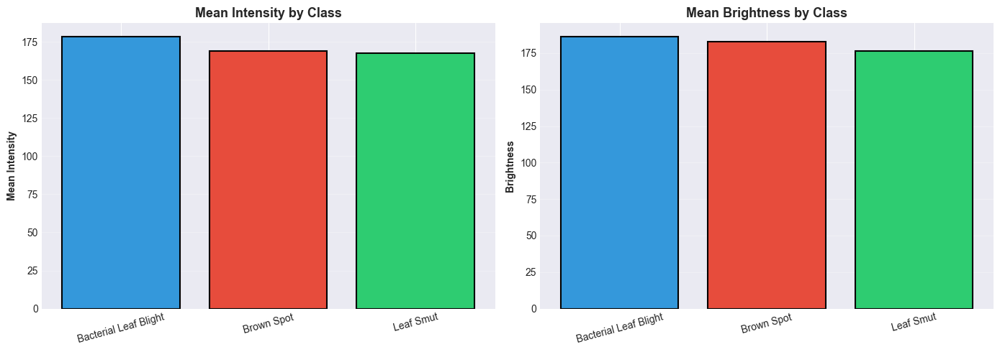

In [25]:
# Box Plots for Statistics
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].bar(stats_df['Class'], stats_df['Mean Intensity'], 
           color=['#3498db', '#e74c3c', '#2ecc71'], edgecolor='black', linewidth=1.5)
axes[0].set_title('Mean Intensity by Class', fontsize=13, fontweight='bold')
axes[0].set_ylabel('Mean Intensity', fontweight='bold')
axes[0].grid(axis='y', alpha=0.3)
axes[0].tick_params(axis='x', rotation=15)

axes[1].bar(stats_df['Class'], stats_df['Mean Brightness'], 
           color=['#3498db', '#e74c3c', '#2ecc71'], edgecolor='black', linewidth=1.5)
axes[1].set_title('Mean Brightness by Class', fontsize=13, fontweight='bold')
axes[1].set_ylabel('Brightness', fontweight='bold')
axes[1].grid(axis='y', alpha=0.3)
axes[1].tick_params(axis='x', rotation=15)

plt.tight_layout()
plt.show()

# Feature Extraction

In [26]:
# Extract Features
def extract_features(images):
    """Extract color, texture, and statistical features"""
    features = []
    
    for img in images:
        # Color features
        r_mean, g_mean, b_mean = img[:,:,0].mean(), img[:,:,1].mean(), img[:,:,2].mean()
        r_std, g_std, b_std = img[:,:,0].std(), img[:,:,1].std(), img[:,:,2].std()
        
        # Convert to grayscale for texture
        gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
        
        # Texture features (using histogram)
        hist = cv2.calcHist([gray], [0], None, [32], [0, 256]).flatten()
        hist = hist / hist.sum()  # Normalize
        
        # Statistical features
        brightness = gray.mean()
        contrast = gray.std()
        
        # Combine features
        feature_vector = np.concatenate([
            [r_mean, g_mean, b_mean, r_std, g_std, b_std, brightness, contrast],
            hist
        ])
        
        features.append(feature_vector)
    
    return np.array(features)

print("\nExtracting features")
X_features = extract_features(X)
print(f"Feature shape: {X_features.shape}")


Extracting features
Feature shape: (119, 40)


In [27]:
# %% Feature Correlation Heatmap
feature_names = ['R_mean', 'G_mean', 'B_mean', 'R_std', 'G_std', 'B_std', 
                'Brightness', 'Contrast'] + [f'Hist_{i}' for i in range(32)]

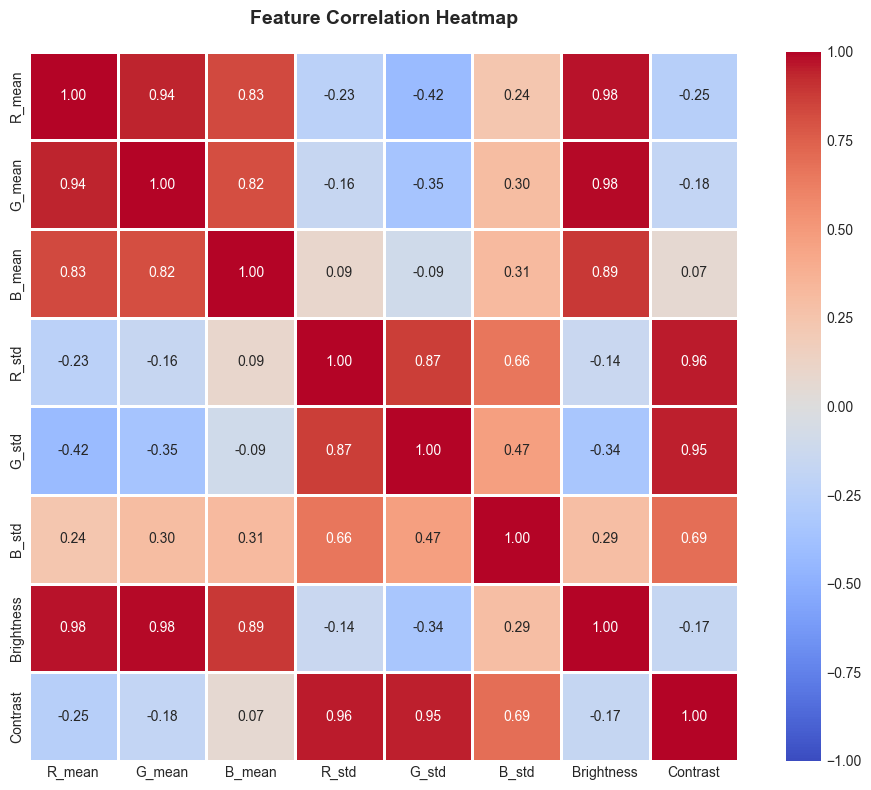

In [28]:
# Take subset for visualization
correlation_features = X_features[:, :8]  # First 8 features
corr_matrix = np.corrcoef(correlation_features.T)

plt.figure(figsize=(10, 8))
sns.heatmap(corr_matrix, annot=True, fmt='.2f', cmap='coolwarm', 
            xticklabels=feature_names[:8], yticklabels=feature_names[:8],
            center=0, vmin=-1, vmax=1, square=True, linewidths=1)
plt.title('Feature Correlation Heatmap', fontsize=14, fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

# Dimensionality Reduction

## PCA Analysis

In [30]:
# PCA Analysis
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_features)

pca = PCA()
X_pca = pca.fit_transform(X_scaled)

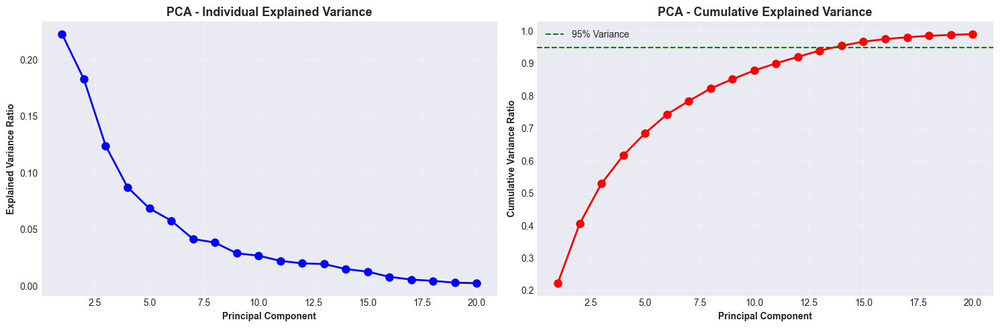

In [31]:
# Explained variance
explained_var = pca.explained_variance_ratio_
cumsum_var = np.cumsum(explained_var)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

ax1.plot(range(1, len(explained_var[:20])+1), explained_var[:20], 
         'bo-', linewidth=2, markersize=8)
ax1.set_title('PCA - Individual Explained Variance', fontsize=13, fontweight='bold')
ax1.set_xlabel('Principal Component', fontweight='bold')
ax1.set_ylabel('Explained Variance Ratio', fontweight='bold')
ax1.grid(alpha=0.3)

ax2.plot(range(1, len(cumsum_var[:20])+1), cumsum_var[:20], 
         'ro-', linewidth=2, markersize=8)
ax2.axhline(y=0.95, color='g', linestyle='--', label='95% Variance')
ax2.set_title('PCA - Cumulative Explained Variance', fontsize=13, fontweight='bold')
ax2.set_xlabel('Principal Component', fontweight='bold')
ax2.set_ylabel('Cumulative Variance Ratio', fontweight='bold')
ax2.legend()
ax2.grid(alpha=0.3)

plt.tight_layout()
plt.show()

In [33]:
print(f"Components for 95% variance: {np.argmax(cumsum_var >= 0.95) + 1}")

Components for 95% variance: 14


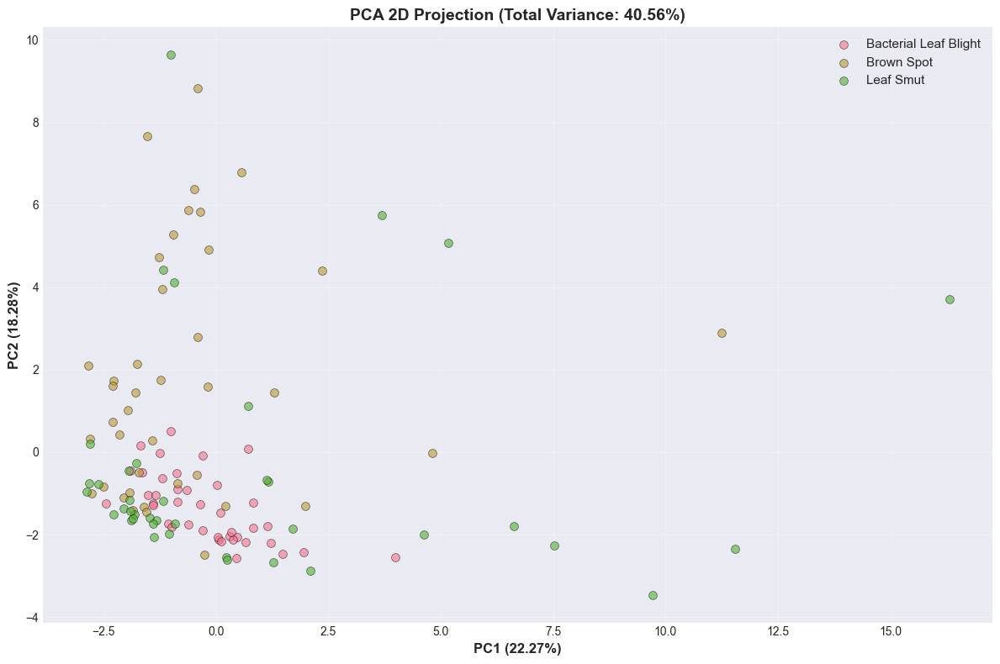

In [34]:
# %% PCA 2D Visualization
pca_2d = PCA(n_components=2)
X_pca_2d = pca_2d.fit_transform(X_scaled)

plt.figure(figsize=(12, 8))
for i, class_name in enumerate(class_names):
    mask = y == i
    plt.scatter(X_pca_2d[mask, 0], X_pca_2d[mask, 1], 
               label=class_name, alpha=0.6, s=50, edgecolors='black', linewidth=0.5)

plt.xlabel(f'PC1 ({pca_2d.explained_variance_ratio_[0]:.2%})', fontsize=12, fontweight='bold')
plt.ylabel(f'PC2 ({pca_2d.explained_variance_ratio_[1]:.2%})', fontsize=12, fontweight='bold')
plt.title(f'PCA 2D Projection (Total Variance: {pca_2d.explained_variance_ratio_.sum():.2%})', 
         fontsize=14, fontweight='bold')
plt.legend(fontsize=11)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

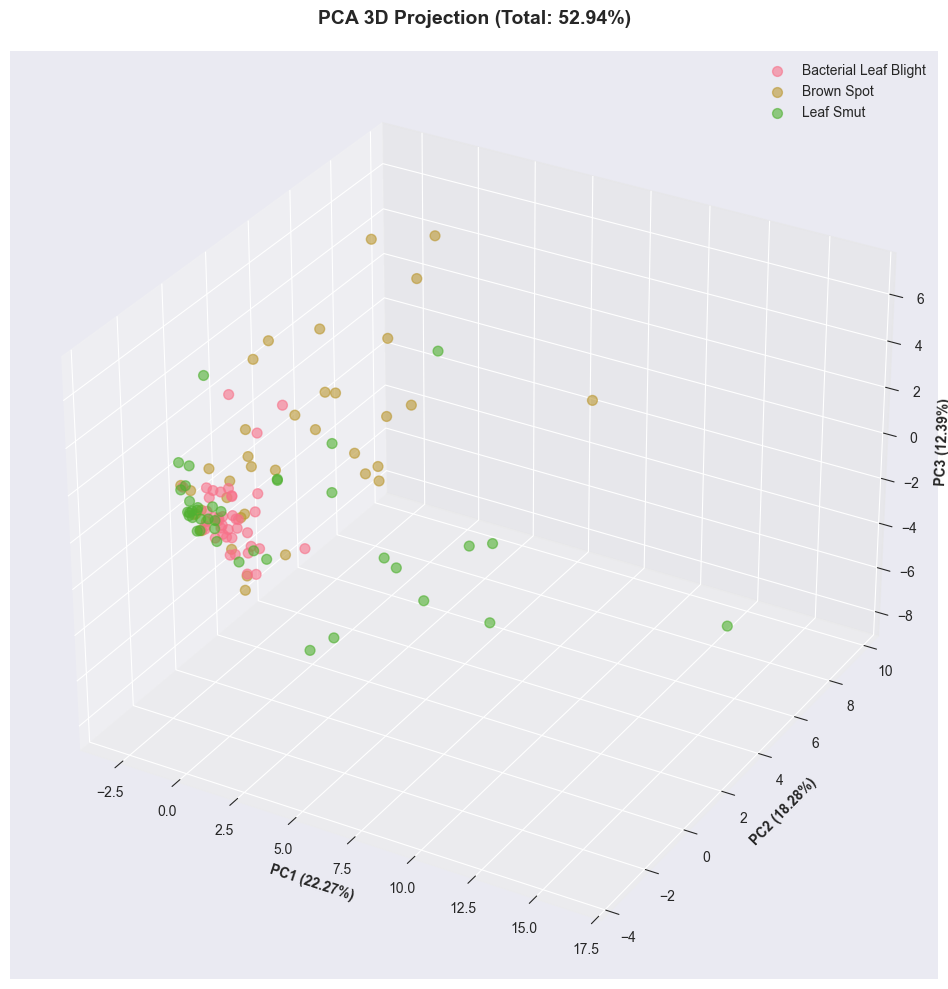

In [35]:
# PCA 3D Visualization
pca_3d = PCA(n_components=3)
X_pca_3d = pca_3d.fit_transform(X_scaled)

fig = plt.figure(figsize=(14, 10))
ax = fig.add_subplot(111, projection='3d')

for i, class_name in enumerate(class_names):
    mask = y == i
    ax.scatter(X_pca_3d[mask, 0], X_pca_3d[mask, 1], X_pca_3d[mask, 2],
              label=class_name, alpha=0.6, s=50)

ax.set_xlabel(f'PC1 ({pca_3d.explained_variance_ratio_[0]:.2%})', fontweight='bold')
ax.set_ylabel(f'PC2 ({pca_3d.explained_variance_ratio_[1]:.2%})', fontweight='bold')
ax.set_zlabel(f'PC3 ({pca_3d.explained_variance_ratio_[2]:.2%})', fontweight='bold')
ax.set_title(f'PCA 3D Projection (Total: {pca_3d.explained_variance_ratio_.sum():.2%})', 
            fontsize=14, fontweight='bold', pad=20)
ax.legend()
plt.tight_layout()
plt.show()

## t-SNE Visualization

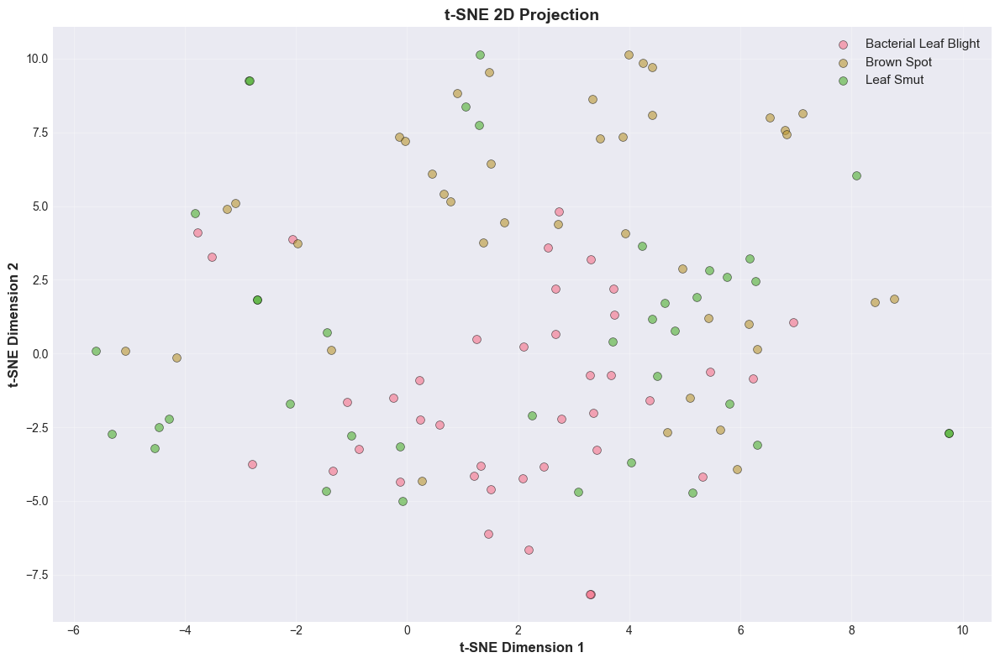

In [110]:
tsne = TSNE(n_components=2, random_state=42, perplexity=30, max_iter=1000)
X_tsne = tsne.fit_transform(X_scaled)

plt.figure(figsize=(12, 8))
for i, class_name in enumerate(class_names):
    mask = y == i
    plt.scatter(X_tsne[mask, 0], X_tsne[mask, 1], 
               label=class_name, alpha=0.6, s=50, edgecolors='black', linewidth=0.5)

plt.xlabel('t-SNE Dimension 1', fontsize=12, fontweight='bold')
plt.ylabel('t-SNE Dimension 2', fontsize=12, fontweight='bold')
plt.title('t-SNE 2D Projection', fontsize=14, fontweight='bold')
plt.legend(fontsize=11)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

# Unsupervised Learning - Clustering

## K-Means Clustering

In [37]:
# Elbow method
inertias = []
silhouette_scores = []
K_range = range(2, 11)

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(X_scaled)
    inertias.append(kmeans.inertia_)
    silhouette_scores.append(silhouette_score(X_scaled, kmeans.labels_))

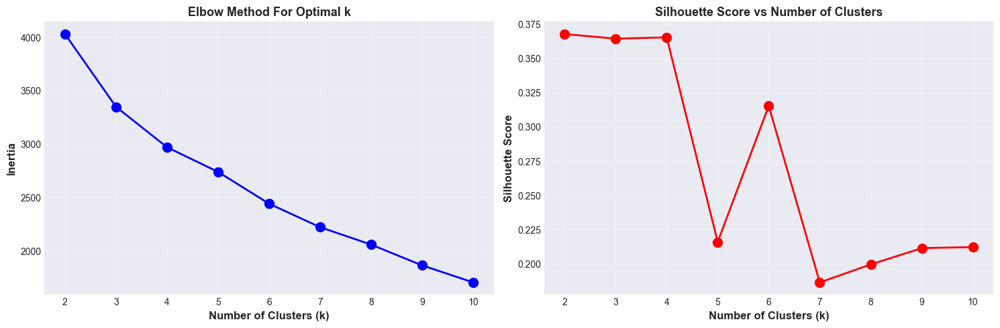

In [38]:
# Elbow plot
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

ax1.plot(list(K_range), inertias, 'bo-', linewidth=2, markersize=10)
ax1.set_xlabel('Number of Clusters (k)', fontsize=12, fontweight='bold')
ax1.set_ylabel('Inertia', fontsize=12, fontweight='bold')
ax1.set_title('Elbow Method For Optimal k', fontsize=13, fontweight='bold')
ax1.grid(alpha=0.3)

ax2.plot(list(K_range), silhouette_scores, 'ro-', linewidth=2, markersize=10)
ax2.set_xlabel('Number of Clusters (k)', fontsize=12, fontweight='bold')
ax2.set_ylabel('Silhouette Score', fontsize=12, fontweight='bold')
ax2.set_title('Silhouette Score vs Number of Clusters', fontsize=13, fontweight='bold')
ax2.grid(alpha=0.3)

plt.tight_layout()
plt.show()

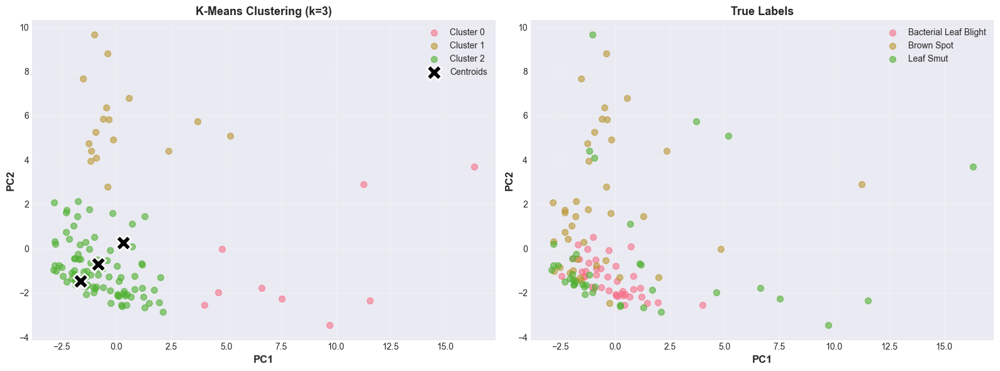

In [41]:
# K-Means with optimal k=3
kmeans = KMeans(n_clusters=3, random_state=42, n_init=10)
clusters = kmeans.fit_predict(X_scaled)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Cluster visualization
for i in range(3):
    mask = clusters == i
    ax1.scatter(X_pca_2d[mask, 0], X_pca_2d[mask, 1], 
               label=f'Cluster {i}', alpha=0.6, s=50)

ax1.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1],
           c='black', marker='X', s=300, edgecolors='white', linewidth=2,
           label='Centroids')
ax1.set_xlabel('PC1', fontsize=12, fontweight='bold')
ax1.set_ylabel('PC2', fontsize=12, fontweight='bold')
ax1.set_title('K-Means Clustering (k=3)', fontsize=13, fontweight='bold')
ax1.legend()
ax1.grid(alpha=0.3)

# True labels
for i, class_name in enumerate(class_names):
    mask = y == i
    ax2.scatter(X_pca_2d[mask, 0], X_pca_2d[mask, 1], 
               label=class_name, alpha=0.6, s=50)

ax2.set_xlabel('PC1', fontsize=12, fontweight='bold')
ax2.set_ylabel('PC2', fontsize=12, fontweight='bold')
ax2.set_title('True Labels', fontsize=13, fontweight='bold')
ax2.legend()
ax2.grid(alpha=0.3)

plt.tight_layout()
plt.show()

## DBSCAN Clustering

Number of clusters: 1
Number of noise points: 22


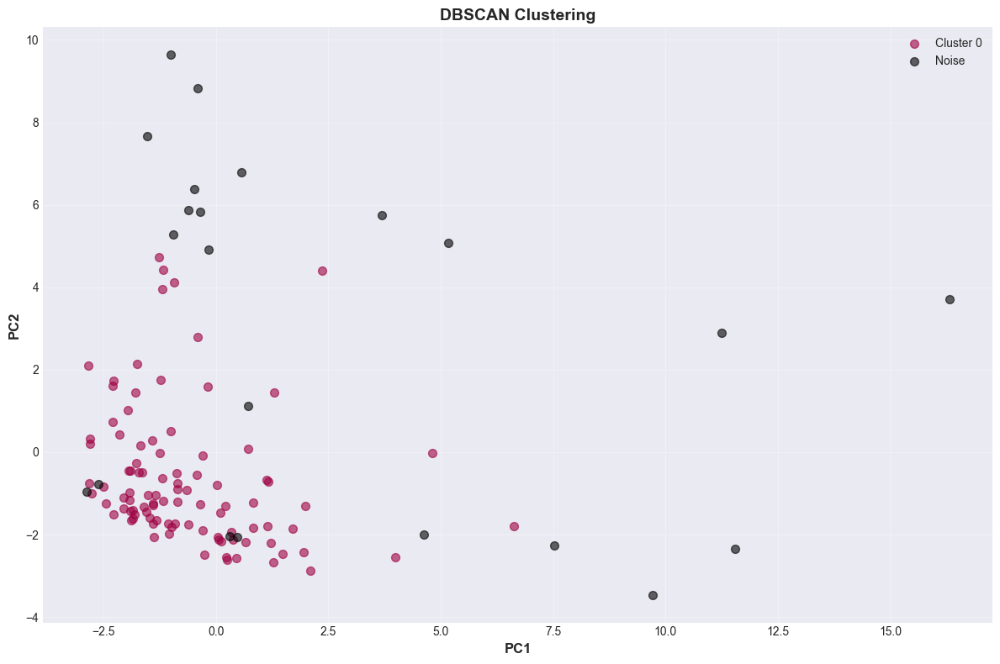

In [42]:
dbscan = DBSCAN(eps=5, min_samples=5)
dbscan_clusters = dbscan.fit_predict(X_scaled)

n_clusters = len(set(dbscan_clusters)) - (1 if -1 in dbscan_clusters else 0)
n_noise = list(dbscan_clusters).count(-1)

print(f"Number of clusters: {n_clusters}")
print(f"Number of noise points: {n_noise}")

plt.figure(figsize=(12, 8))
unique_labels = set(dbscan_clusters)
colors = plt.cm.Spectral(np.linspace(0, 1, len(unique_labels)))

for label, color in zip(unique_labels, colors):
    if label == -1:
        color = 'black'
        label_name = 'Noise'
    else:
        label_name = f'Cluster {label}'
    
    mask = dbscan_clusters == label
    plt.scatter(X_pca_2d[mask, 0], X_pca_2d[mask, 1],
               c=[color], label=label_name, alpha=0.6, s=50)

plt.xlabel('PC1', fontsize=12, fontweight='bold')
plt.ylabel('PC2', fontsize=12, fontweight='bold')
plt.title('DBSCAN Clustering', fontsize=14, fontweight='bold')
plt.legend()
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

## Hierarchical Clustering

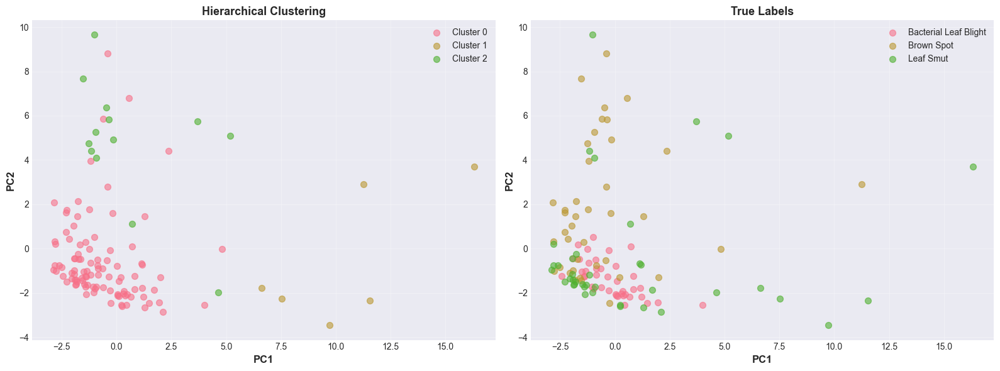

In [43]:
hierarchical = AgglomerativeClustering(n_clusters=3)
hier_clusters = hierarchical.fit_predict(X_scaled)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Hierarchical clustering
for i in range(3):
    mask = hier_clusters == i
    ax1.scatter(X_pca_2d[mask, 0], X_pca_2d[mask, 1], 
               label=f'Cluster {i}', alpha=0.6, s=50)

ax1.set_xlabel('PC1', fontsize=12, fontweight='bold')
ax1.set_ylabel('PC2', fontsize=12, fontweight='bold')
ax1.set_title('Hierarchical Clustering', fontsize=13, fontweight='bold')
ax1.legend()
ax1.grid(alpha=0.3)

# True labels
for i, class_name in enumerate(class_names):
    mask = y == i
    ax2.scatter(X_pca_2d[mask, 0], X_pca_2d[mask, 1], 
               label=class_name, alpha=0.6, s=50)

ax2.set_xlabel('PC1', fontsize=12, fontweight='bold')
ax2.set_ylabel('PC2', fontsize=12, fontweight='bold')
ax2.set_title('True Labels', fontsize=13, fontweight='bold')
ax2.legend()
ax2.grid(alpha=0.3)

plt.tight_layout()
plt.show()

# Train-Test Split

In [44]:
# Split Data
X_train, X_test, y_train, y_test = train_test_split(
    X_scaled, y, test_size=0.2, random_state=42, stratify=y
)

X_img_train, X_img_test, y_img_train, y_img_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

In [45]:
print(f"\nTraining set: {len(X_train)} samples")
print(f"Test set: {len(X_test)} samples")


Training set: 95 samples
Test set: 24 samples


# Machine Learning Models

In [46]:
# Train Multiple ML Models
ml_models = {
    'Logistic Regression': LogisticRegression(max_iter=1000, random_state=42),
    'Decision Tree': DecisionTreeClassifier(random_state=42),
    'Random Forest': RandomForestClassifier(n_estimators=100, random_state=42),
    'Gradient Boosting': GradientBoostingClassifier(n_estimators=100, random_state=42),
    'SVM': SVC(kernel='rbf', random_state=42),
    'KNN': KNeighborsClassifier(n_neighbors=5),
    'Naive Bayes': GaussianNB(),
    'AdaBoost': AdaBoostClassifier(n_estimators=100, random_state=42)
}

In [47]:
results = []
trained_models = {}

In [48]:
for name, model in ml_models.items():
    print(f"\nTraining {name}...")
    
    # Train
    model.fit(X_train, y_train)
    trained_models[name] = model
    
    # Predict
    y_pred = model.predict(X_test)
    
    # Metrics
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred, average='weighted')
    recall = recall_score(y_test, y_pred, average='weighted')
    f1 = f1_score(y_test, y_pred, average='weighted')
    
    # Cross-validation
    cv_scores = cross_val_score(model, X_train, y_train, cv=5)
    
    results.append({
        'Model': name,
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1-Score': f1,
        'CV Mean': cv_scores.mean(),
        'CV Std': cv_scores.std()
    })
    
    print(f"Accuracy: {accuracy:.4f}")
    print(f"F1-Score: {f1:.4f}")
    print(f"CV Score: {cv_scores.mean():.4f} (+/- {cv_scores.std():.4f})")


Training Logistic Regression...
Accuracy: 0.7083
F1-Score: 0.7087
CV Score: 0.6632 (+/- 0.0421)

Training Decision Tree...
Accuracy: 0.4583
F1-Score: 0.4083
CV Score: 0.6211 (+/- 0.1219)

Training Random Forest...
Accuracy: 0.7917
F1-Score: 0.7912
CV Score: 0.7474 (+/- 0.0394)

Training Gradient Boosting...
Accuracy: 0.8333
F1-Score: 0.8328
CV Score: 0.7684 (+/- 0.0537)

Training SVM...
Accuracy: 0.6667
F1-Score: 0.6724
CV Score: 0.6211 (+/- 0.0965)

Training KNN...
Accuracy: 0.5833
F1-Score: 0.5585
CV Score: 0.6000 (+/- 0.0537)

Training Naive Bayes...
Accuracy: 0.5833
F1-Score: 0.5659
CV Score: 0.5474 (+/- 0.0714)

Training AdaBoost...
Accuracy: 0.7917
F1-Score: 0.7871
CV Score: 0.6000 (+/- 0.0855)


In [49]:
results_df = pd.DataFrame(results)
print(results_df.to_string(index=False))

              Model  Accuracy  Precision   Recall  F1-Score  CV Mean   CV Std
Logistic Regression  0.708333   0.722222 0.708333  0.708683 0.663158 0.042105
      Decision Tree  0.458333   0.375000 0.458333  0.408333 0.621053 0.121851
      Random Forest  0.791667   0.794974 0.791667  0.791176 0.747368 0.039386
  Gradient Boosting  0.833333   0.836640 0.833333  0.832843 0.768421 0.053674
                SVM  0.666667   0.777778 0.666667  0.672439 0.621053 0.096475
                KNN  0.583333   0.726984 0.583333  0.558454 0.600000 0.053674
        Naive Bayes  0.583333   0.756944 0.583333  0.565873 0.547368 0.071393
           AdaBoost  0.791667   0.796296 0.791667  0.787115 0.600000 0.085516


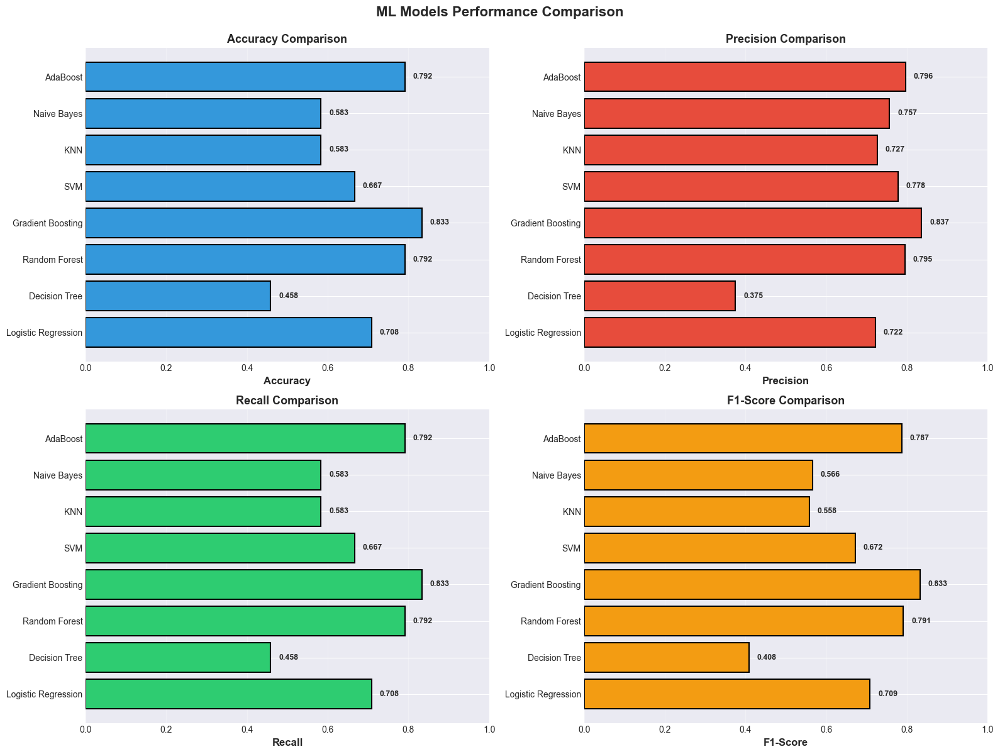

In [50]:
# Model Comparison Visualization
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score']
colors_list = ['#3498db', '#e74c3c', '#2ecc71', '#f39c12']

for idx, (ax, metric, color) in enumerate(zip(axes.flatten(), metrics, colors_list)):
    bars = ax.barh(results_df['Model'], results_df[metric], color=color, edgecolor='black', linewidth=1.5)
    ax.set_xlabel(metric, fontsize=12, fontweight='bold')
    ax.set_title(f'{metric} Comparison', fontsize=13, fontweight='bold')
    ax.set_xlim([0, 1])
    ax.grid(axis='x', alpha=0.3)
    
    for i, bar in enumerate(bars):
        width = bar.get_width()
        ax.text(width + 0.02, bar.get_y() + bar.get_height()/2,
               f'{width:.3f}', ha='left', va='center', fontsize=9, fontweight='bold')

plt.suptitle('ML Models Performance Comparison', fontsize=16, fontweight='bold', y=0.995)
plt.tight_layout()
plt.show()

In [51]:
# Best Model Analysis
best_model_name = results_df.loc[results_df['Accuracy'].idxmax(), 'Model']
best_model = trained_models[best_model_name]

In [52]:
print(f"BEST ML MODEL: {best_model_name}")

BEST ML MODEL: Gradient Boosting


In [53]:
y_pred_best = best_model.predict(X_test)

In [54]:
# Classification Report
print("\nClassification Report:")
print(classification_report(y_test, y_pred_best, target_names=class_names))


Classification Report:
                       precision    recall  f1-score   support

Bacterial Leaf Blight       0.86      0.75      0.80         8
           Brown Spot       0.88      0.88      0.88         8
            Leaf Smut       0.78      0.88      0.82         8

             accuracy                           0.83        24
            macro avg       0.84      0.83      0.83        24
         weighted avg       0.84      0.83      0.83        24



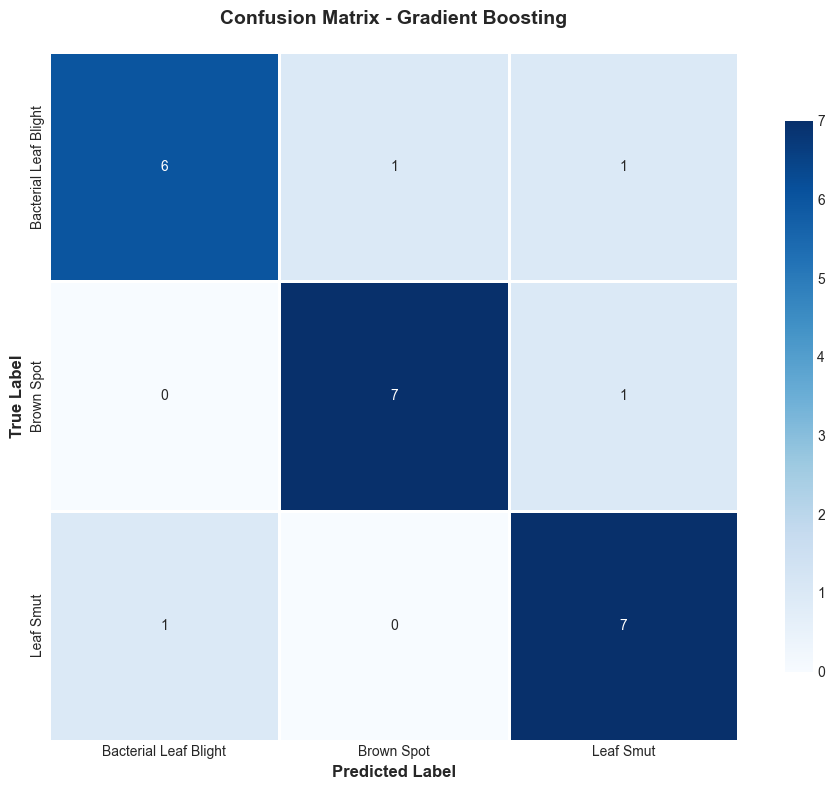

In [55]:
# Confusion Matrix
cm = confusion_matrix(y_test, y_pred_best)

plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
            xticklabels=class_names, yticklabels=class_names,
            square=True, linewidths=2, cbar_kws={'shrink': 0.8})
plt.title(f'Confusion Matrix - {best_model_name}', fontsize=14, fontweight='bold', pad=20)
plt.ylabel('True Label', fontsize=12, fontweight='bold')
plt.xlabel('Predicted Label', fontsize=12, fontweight='bold')
plt.tight_layout()
plt.show()

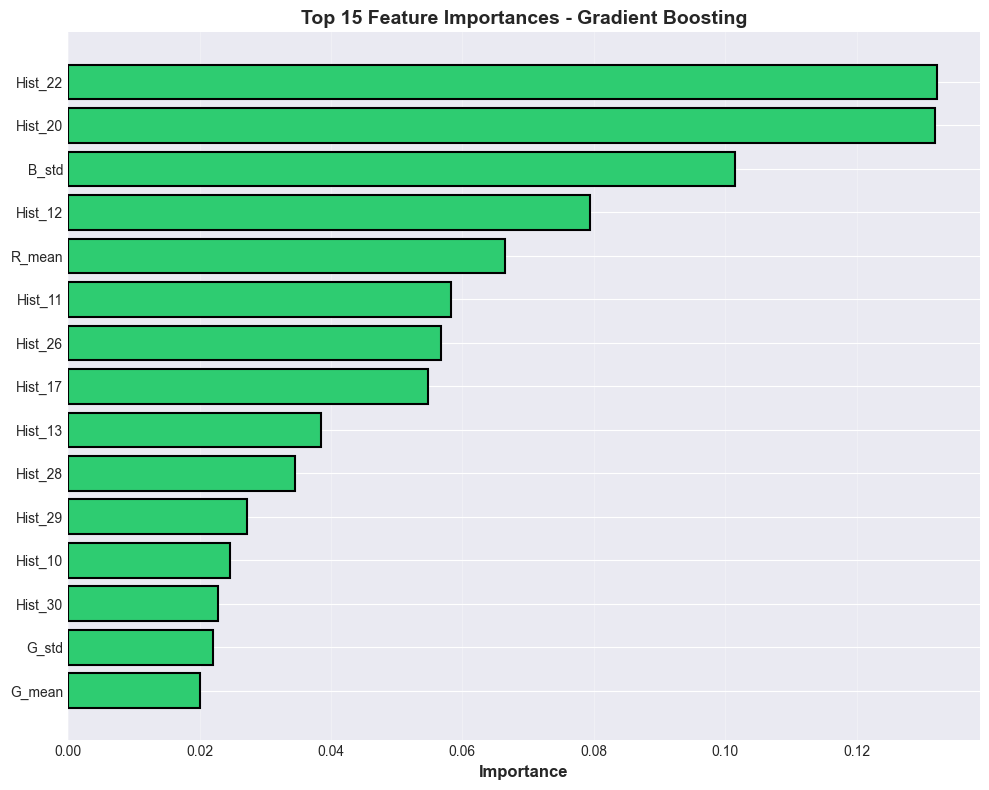

In [56]:
# Feature Importance (for tree-based models)
if hasattr(best_model, 'feature_importances_'):
    importances = best_model.feature_importances_
    top_indices = np.argsort(importances)[-15:]  # Top 15 features
    
    plt.figure(figsize=(10, 8))
    plt.barh(range(len(top_indices)), importances[top_indices], 
             color='#2ecc71', edgecolor='black', linewidth=1.5)
    plt.yticks(range(len(top_indices)), 
               [feature_names[i] if i < len(feature_names) else f'Feature_{i}' for i in top_indices])
    plt.xlabel('Importance', fontsize=12, fontweight='bold')
    plt.title(f'Top 15 Feature Importances - {best_model_name}', fontsize=14, fontweight='bold')
    plt.grid(axis='x', alpha=0.3)
    plt.tight_layout()
    plt.show()

# Deep Learning - CNN Models

In [57]:
# Prepare Data for Deep Learning
X_img_train_norm = X_img_train / 255.0
X_img_test_norm = X_img_test / 255.0

y_train_cat = keras.utils.to_categorical(y_img_train, 3)
y_test_cat = keras.utils.to_categorical(y_img_test, 3)

In [58]:
# Data Augmentation
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    horizontal_flip=True,
    zoom_range=0.2,
    fill_mode='nearest'
)

datagen.fit(X_img_train_norm)

In [59]:
# Custom CNN Model
def create_cnn_model(input_shape=(224, 224, 3)):
    """Create custom CNN architecture"""
    model = models.Sequential([
        # Block 1
        layers.Conv2D(32, (3, 3), activation='relu', padding='same', 
                     input_shape=input_shape),
        layers.BatchNormalization(),
        layers.Conv2D(32, (3, 3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.25),
        
        # Block 2
        layers.Conv2D(64, (3, 3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.Conv2D(64, (3, 3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.25),
        
        # Block 3
        layers.Conv2D(128, (3, 3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.Conv2D(128, (3, 3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.25),
        
        # Block 4
        layers.Conv2D(256, (3, 3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.Conv2D(256, (3, 3), activation='relu', padding='same'),
        layers.BatchNormalization(),
        layers.MaxPooling2D((2, 2)),
        layers.Dropout(0.25),
        
        # Classifier
        layers.Flatten(),
        layers.Dense(512, activation='relu'),
        layers.BatchNormalization(),
        layers.Dropout(0.5),
        layers.Dense(256, activation='relu'),
        layers.BatchNormalization(),
        layers.Dropout(0.5),
        layers.Dense(3, activation='softmax')
    ])
    
    return model

In [60]:
# Build and Train CNN

cnn_model = create_cnn_model()
cnn_model.compile(
    optimizer='adam',
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

In [61]:
print("\nModel Architecture:")
cnn_model.summary()


Model Architecture:


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 224, 224, 32)   │         9,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 112, 112, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_4           │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 56, 56, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_5           │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 28, 28, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_6           │ (None, 28, 28, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 28, 28, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 27,001,891 (103.00 MB)

 Trainable params: 26,998,435 (102.99 MB)

 Non-trainable params: 3,456 (13.50 KB)

In [62]:
# Callbacks
callbacks = [
    EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True, verbose=1),
    ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, min_lr=1e-7, verbose=1)
]

In [63]:
#  Train
history_cnn = cnn_model.fit(
    datagen.flow(X_img_train_norm, y_train_cat, batch_size=32),
    validation_data=(X_img_test_norm, y_test_cat),
    epochs=50,
    callbacks=callbacks,
    verbose=1
)

Epoch 1/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 14s 3s/step - accuracy: 0.4105 - loss: 1.5868 - val_accuracy: 0.3333 - val_loss: 1.1656 - learning_rate: 0.0010
Epoch 2/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 2s/step - accuracy: 0.5789 - loss: 1.2997 - val_accuracy: 0.3333 - val_loss: 1.5713 - learning_rate: 0.0010
Epoch 3/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 2s/step - accuracy: 0.6421 - loss: 1.0047 - val_accuracy: 0.3333 - val_loss: 1.7463 - learning_rate: 0.0010
Epoch 4/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 2s/step - accuracy: 0.6737 - loss: 0.8266 - val_accuracy: 0.3333 - val_loss: 1.9937 - learning_rate: 0.0010
Epoch 5/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 2s/step - accuracy: 0.7263 - loss: 0.7697 - val_accuracy: 0.3333 - val_loss: 2.2314 - learning_rate: 0.0010
Epoch 6/50
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.8105 - loss: 0.5943
Epoch 6: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 2s/step - accuracy: 0.7474 - loss: 0.7402 - val_accuracy: 0.3333 - val_loss: 2.

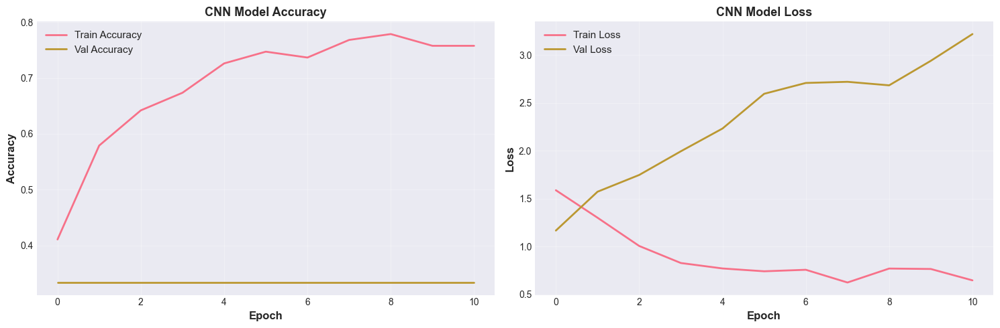

In [64]:
# Plot CNN Training History
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

ax1.plot(history_cnn.history['accuracy'], label='Train Accuracy', linewidth=2)
ax1.plot(history_cnn.history['val_accuracy'], label='Val Accuracy', linewidth=2)
ax1.set_xlabel('Epoch', fontsize=12, fontweight='bold')
ax1.set_ylabel('Accuracy', fontsize=12, fontweight='bold')
ax1.set_title('CNN Model Accuracy', fontsize=13, fontweight='bold')
ax1.legend(fontsize=11)
ax1.grid(alpha=0.3)

ax2.plot(history_cnn.history['loss'], label='Train Loss', linewidth=2)
ax2.plot(history_cnn.history['val_loss'], label='Val Loss', linewidth=2)
ax2.set_xlabel('Epoch', fontsize=12, fontweight='bold')
ax2.set_ylabel('Loss', fontsize=12, fontweight='bold')
ax2.set_title('CNN Model Loss', fontsize=13, fontweight='bold')
ax2.legend(fontsize=11)
ax2.grid(alpha=0.3)

plt.tight_layout()
plt.show()

In [65]:
# Evaluate CNN
y_pred_cnn = cnn_model.predict(X_img_test_norm, verbose=0)
y_pred_cnn_classes = np.argmax(y_pred_cnn, axis=1)

In [66]:
print(classification_report(y_img_test, y_pred_cnn_classes, target_names=class_names))

                       precision    recall  f1-score   support

Bacterial Leaf Blight       0.00      0.00      0.00         8
           Brown Spot       0.33      1.00      0.50         8
            Leaf Smut       0.00      0.00      0.00         8

             accuracy                           0.33        24
            macro avg       0.11      0.33      0.17        24
         weighted avg       0.11      0.33      0.17        24



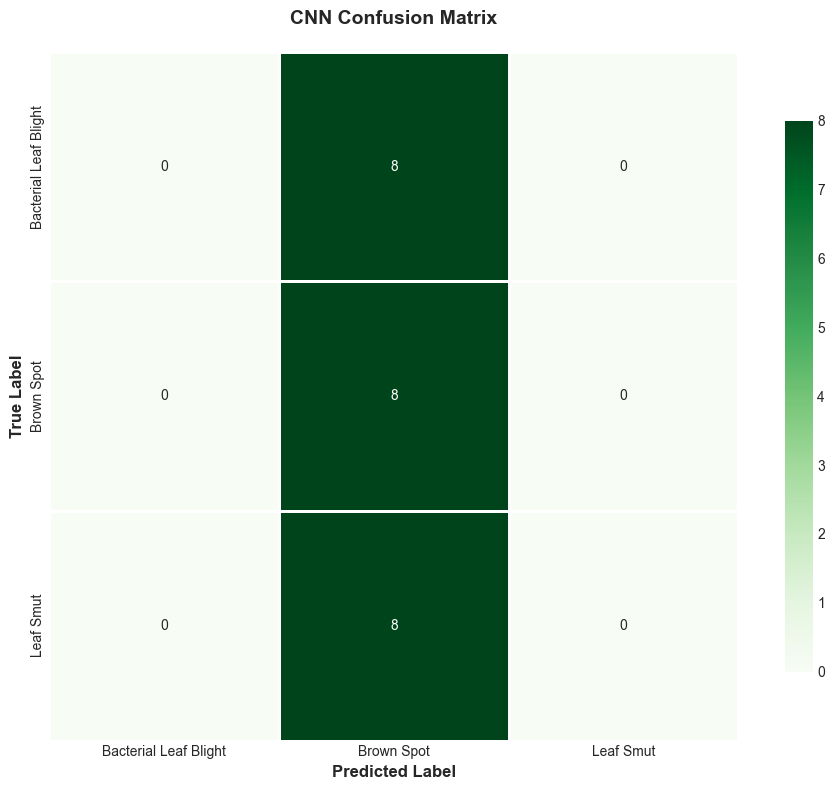

In [67]:
# CNN Confusion Matrix
cm_cnn = confusion_matrix(y_img_test, y_pred_cnn_classes)

plt.figure(figsize=(10, 8))
sns.heatmap(cm_cnn, annot=True, fmt='d', cmap='Greens',
            xticklabels=class_names, yticklabels=class_names,
            square=True, linewidths=2, cbar_kws={'shrink': 0.8})
plt.title('CNN Confusion Matrix', fontsize=14, fontweight='bold', pad=20)
plt.ylabel('True Label', fontsize=12, fontweight='bold')
plt.xlabel('Predicted Label', fontsize=12, fontweight='bold')
plt.tight_layout()
plt.show()

# Transfer Learning - VGG16

In [68]:
# VGG16 Model
def create_vgg16_model(input_shape=(224, 224, 3)):
    """Create VGG16 transfer learning model"""
    base_model = VGG16(weights='imagenet', include_top=False, input_shape=input_shape)
    
    # Freeze base layers
    base_model.trainable = False
    
    model = models.Sequential([
        base_model,
        layers.GlobalAveragePooling2D(),
        layers.Dense(512, activation='relu'),
        layers.BatchNormalization(),
        layers.Dropout(0.5),
        layers.Dense(256, activation='relu'),
        layers.BatchNormalization(),
        layers.Dropout(0.5),
        layers.Dense(3, activation='softmax')
    ])
    
    return model

In [69]:
vgg16_model = create_vgg16_model()
vgg16_model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 5s 0us/step


In [70]:
# Train VGG16
history_vgg16 = vgg16_model.fit(
    datagen.flow(X_img_train_norm, y_train_cat, batch_size=32),
    validation_data=(X_img_test_norm, y_test_cat),
    epochs=30,
    callbacks=callbacks,
    verbose=1
)

Epoch 1/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 10s 3s/step - accuracy: 0.4000 - loss: 1.5994 - val_accuracy: 0.3333 - val_loss: 1.0973 - learning_rate: 1.0000e-04
Epoch 2/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 7s 2s/step - accuracy: 0.3684 - loss: 1.5761 - val_accuracy: 0.3333 - val_loss: 1.0914 - learning_rate: 1.0000e-04
Epoch 3/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 2s/step - accuracy: 0.3368 - loss: 1.8603 - val_accuracy: 0.3333 - val_loss: 1.0853 - learning_rate: 1.0000e-04
Epoch 4/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 2s/step - accuracy: 0.4421 - loss: 1.4384 - val_accuracy: 0.3333 - val_loss: 1.0801 - learning_rate: 1.0000e-04
Epoch 5/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 2s/step - accuracy: 0.4947 - loss: 1.3892 - val_accuracy: 0.3333 - val_loss: 1.0751 - learning_rate: 1.0000e-04
Epoch 6/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 2s/step - accuracy: 0.5053 - loss: 1.1558 - val_accuracy: 0.3333 - val_loss: 1.0689 - learning_rate: 1.0000e-04
Epoch 7/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 6s 2s/step - accuracy: 0.4421 - loss: 1.5355 - val_accura

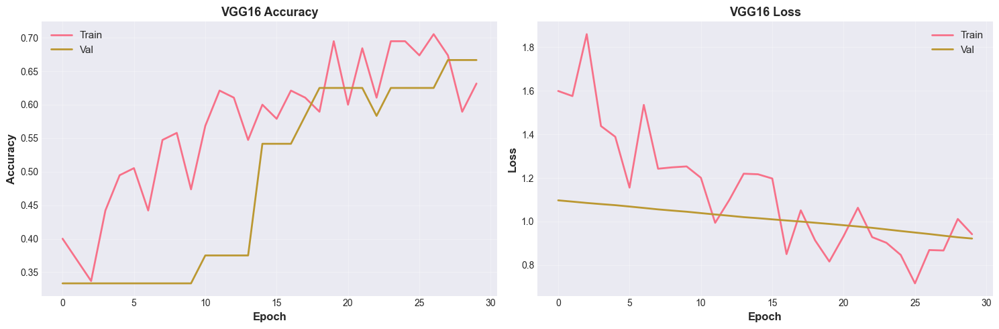

In [71]:
# VGG16 Training History
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

ax1.plot(history_vgg16.history['accuracy'], label='Train', linewidth=2)
ax1.plot(history_vgg16.history['val_accuracy'], label='Val', linewidth=2)
ax1.set_xlabel('Epoch', fontsize=12, fontweight='bold')
ax1.set_ylabel('Accuracy', fontsize=12, fontweight='bold')
ax1.set_title('VGG16 Accuracy', fontsize=13, fontweight='bold')
ax1.legend(fontsize=11)
ax1.grid(alpha=0.3)

ax2.plot(history_vgg16.history['loss'], label='Train', linewidth=2)
ax2.plot(history_vgg16.history['val_loss'], label='Val', linewidth=2)
ax2.set_xlabel('Epoch', fontsize=12, fontweight='bold')
ax2.set_ylabel('Loss', fontsize=12, fontweight='bold')
ax2.set_title('VGG16 Loss', fontsize=13, fontweight='bold')
ax2.legend(fontsize=11)
ax2.grid(alpha=0.3)

plt.tight_layout()
plt.show()

In [72]:
# Evaluate VGG16
y_pred_vgg16 = vgg16_model.predict(X_img_test_norm, verbose=0)
y_pred_vgg16_classes = np.argmax(y_pred_vgg16, axis=1)

print(classification_report(y_img_test, y_pred_vgg16_classes, target_names=class_names))

                       precision    recall  f1-score   support

Bacterial Leaf Blight       1.00      0.25      0.40         8
           Brown Spot       0.64      0.88      0.74         8
            Leaf Smut       0.64      0.88      0.74         8

             accuracy                           0.67        24
            macro avg       0.76      0.67      0.62        24
         weighted avg       0.76      0.67      0.62        24



# Transfer Learning - ResNet50

In [73]:
# ResNet50 Model
def create_resnet50_model(input_shape=(224, 224, 3)):
    """Create ResNet50 transfer learning model"""
    base_model = ResNet50(weights='imagenet', include_top=False, input_shape=input_shape)
    base_model.trainable = False
    
    model = models.Sequential([
        base_model,
        layers.GlobalAveragePooling2D(),
        layers.Dense(512, activation='relu'),
        layers.BatchNormalization(),
        layers.Dropout(0.5),
        layers.Dense(256, activation='relu'),
        layers.BatchNormalization(),
        layers.Dropout(0.5),
        layers.Dense(3, activation='softmax')
    ])
    
    return model

In [74]:
resnet_model = create_resnet50_model()
resnet_model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 6s 0us/step


In [75]:
# Train ResNet50
history_resnet = resnet_model.fit(
    datagen.flow(X_img_train_norm, y_train_cat, batch_size=32),
    validation_data=(X_img_test_norm, y_test_cat),
    epochs=30,
    callbacks=callbacks,
    verbose=1
)

Epoch 1/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 11s 2s/step - accuracy: 0.3263 - loss: 1.9170 - val_accuracy: 0.3333 - val_loss: 1.2194 - learning_rate: 1.0000e-04
Epoch 2/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 967ms/step - accuracy: 0.3158 - loss: 2.1449 - val_accuracy: 0.3333 - val_loss: 1.2267 - learning_rate: 1.0000e-04
Epoch 3/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 939ms/step - accuracy: 0.3684 - loss: 1.8625 - val_accuracy: 0.3333 - val_loss: 1.2349 - learning_rate: 1.0000e-04
Epoch 4/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 911ms/step - accuracy: 0.2842 - loss: 2.0520 - val_accuracy: 0.3333 - val_loss: 1.2414 - learning_rate: 1.0000e-04
Epoch 5/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 620ms/step - accuracy: 0.4150 - loss: 1.6162
Epoch 5: ReduceLROnPlateau reducing learning rate to 4.999999873689376e-05.
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 885ms/step - accuracy: 0.4105 - loss: 1.7324 - val_accuracy: 0.3333 - val_loss: 1.2523 - learning_rate: 1.0000e-04
Epoch 6/30
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 918ms/step - accuracy: 0.3789 - loss: 1.7683

In [76]:
# Evaluate ResNet50
y_pred_resnet = resnet_model.predict(X_img_test_norm, verbose=0)
y_pred_resnet_classes = np.argmax(y_pred_resnet, axis=1)

print(classification_report(y_img_test, y_pred_resnet_classes, target_names=class_names))

                       precision    recall  f1-score   support

Bacterial Leaf Blight       0.33      1.00      0.50         8
           Brown Spot       0.00      0.00      0.00         8
            Leaf Smut       0.00      0.00      0.00         8

             accuracy                           0.33        24
            macro avg       0.11      0.33      0.17        24
         weighted avg       0.11      0.33      0.17        24



# ANN Model

In [77]:
# Build ANN
def create_ann_model(input_dim):
    """Create Artificial Neural Network"""
    model = models.Sequential([
        layers.Dense(512, activation='relu', input_dim=input_dim),
        layers.BatchNormalization(),
        layers.Dropout(0.4),
        layers.Dense(256, activation='relu'),
        layers.BatchNormalization(),
        layers.Dropout(0.4),
        layers.Dense(128, activation='relu'),
        layers.BatchNormalization(),
        layers.Dropout(0.3),
        layers.Dense(64, activation='relu'),
        layers.BatchNormalization(),
        layers.Dropout(0.3),
        layers.Dense(3, activation='softmax')
    ])
    
    return model

In [78]:
ann_model = create_ann_model(X_train.shape[1])
ann_model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

In [79]:
# Train ANN
history_ann = ann_model.fit(
    X_train, y_train,
    validation_data=(X_test, y_test),
    epochs=100,
    batch_size=32,
    callbacks=callbacks,
    verbose=1
)

Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 2s 104ms/step - accuracy: 0.2526 - loss: 1.8367 - val_accuracy: 0.4583 - val_loss: 1.0413 - learning_rate: 0.0010
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.3579 - loss: 1.4865 - val_accuracy: 0.6667 - val_loss: 1.0142 - learning_rate: 0.0010
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step - accuracy: 0.4737 - loss: 1.1818 - val_accuracy: 0.7500 - val_loss: 0.9814 - learning_rate: 0.0010
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 0.5684 - loss: 0.9051 - val_accuracy: 0.8333 - val_loss: 0.9513 - learning_rate: 0.0010
Epoch 5/100
1/3 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 0.7188 - loss: 0.8289
Epoch 5: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - accuracy: 0.6421 - loss: 0.9175 - val_accuracy: 0.7917 - val_loss: 0.9284 - learning_rate: 0.0010
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step - accuracy: 0.6316 - loss: 0.8588 - val_accuracy: 0

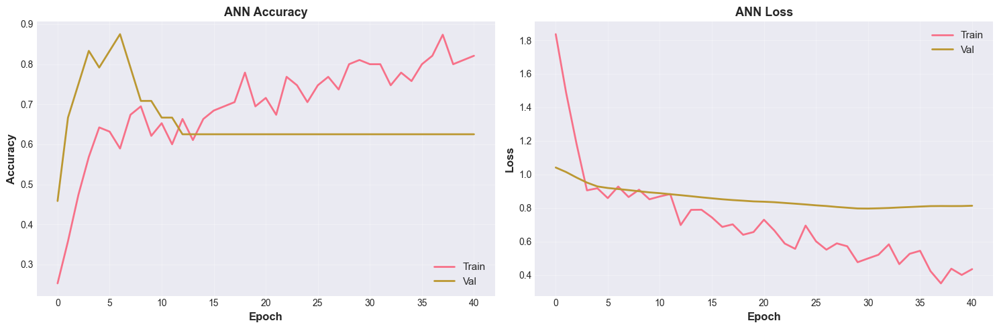

In [80]:
# ANN Training History
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

ax1.plot(history_ann.history['accuracy'], label='Train', linewidth=2)
ax1.plot(history_ann.history['val_accuracy'], label='Val', linewidth=2)
ax1.set_xlabel('Epoch', fontsize=12, fontweight='bold')
ax1.set_ylabel('Accuracy', fontsize=12, fontweight='bold')
ax1.set_title('ANN Accuracy', fontsize=13, fontweight='bold')
ax1.legend(fontsize=11)
ax1.grid(alpha=0.3)

ax2.plot(history_ann.history['loss'], label='Train', linewidth=2)
ax2.plot(history_ann.history['val_loss'], label='Val', linewidth=2)
ax2.set_xlabel('Epoch', fontsize=12, fontweight='bold')
ax2.set_ylabel('Loss', fontsize=12, fontweight='bold')
ax2.set_title('ANN Loss', fontsize=13, fontweight='bold')
ax2.legend(fontsize=11)
ax2.grid(alpha=0.3)

plt.tight_layout()
plt.show()

In [81]:
# Evaluate ANN
y_pred_ann = ann_model.predict(X_test, verbose=0)
y_pred_ann_classes = np.argmax(y_pred_ann, axis=1)

print(classification_report(y_test, y_pred_ann_classes, target_names=class_names))

                       precision    recall  f1-score   support

Bacterial Leaf Blight       0.47      1.00      0.64         8
           Brown Spot       1.00      0.62      0.77         8
            Leaf Smut       1.00      0.25      0.40         8

             accuracy                           0.62        24
            macro avg       0.82      0.62      0.60        24
         weighted avg       0.82      0.62      0.60        24



# RNN/LSTM Model

In [82]:
# Prepare Sequential Data for RNN
# Reshape features for RNN (samples, timesteps, features)
n_timesteps = 10
n_features = X_train.shape[1] // n_timesteps

X_train_rnn = X_train[:, :n_timesteps*n_features].reshape(-1, n_timesteps, n_features)
X_test_rnn = X_test[:, :n_timesteps*n_features].reshape(-1, n_timesteps, n_features)

# %% Build RNN Model
def create_rnn_model(timesteps, features):
    """Create RNN with LSTM layers"""
    model = models.Sequential([
        layers.LSTM(128, return_sequences=True, input_shape=(timesteps, features)),
        layers.Dropout(0.3),
        layers.LSTM(64, return_sequences=True),
        layers.Dropout(0.3),
        layers.LSTM(32),
        layers.Dropout(0.3),
        layers.Dense(64, activation='relu'),
        layers.Dropout(0.3),
        layers.Dense(3, activation='softmax')
    ])
    
    return model

In [83]:
rnn_model = create_rnn_model(n_timesteps, n_features)
rnn_model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

In [84]:
# Train RNN
history_rnn = rnn_model.fit(
    X_train_rnn, y_train,
    validation_data=(X_test_rnn, y_test),
    epochs=100,
    batch_size=32,
    callbacks=callbacks,
    verbose=1
)

Epoch 1/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 3s 190ms/step - accuracy: 0.2737 - loss: 1.1018 - val_accuracy: 0.4583 - val_loss: 1.0958 - learning_rate: 0.0010
Epoch 2/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.4211 - loss: 1.0971 - val_accuracy: 0.5417 - val_loss: 1.0938 - learning_rate: 0.0010
Epoch 3/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 0.4105 - loss: 1.0932 - val_accuracy: 0.5833 - val_loss: 1.0900 - learning_rate: 0.0010
Epoch 4/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 0.5053 - loss: 1.0862 - val_accuracy: 0.5833 - val_loss: 1.0852 - learning_rate: 0.0010
Epoch 5/100
1/3 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step - accuracy: 0.4375 - loss: 1.0959
Epoch 5: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - accuracy: 0.4947 - loss: 1.0867 - val_accuracy: 0.5833 - val_loss: 1.0797 - learning_rate: 0.0010
Epoch 6/100
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 0.4947 - loss: 1.0816 - val_accuracy: 0

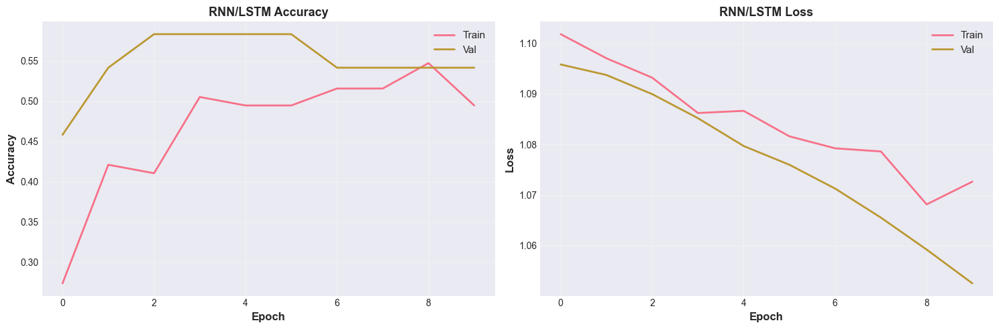

In [85]:
# RNN Training History
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

ax1.plot(history_rnn.history['accuracy'], label='Train', linewidth=2)
ax1.plot(history_rnn.history['val_accuracy'], label='Val', linewidth=2)
ax1.set_xlabel('Epoch', fontsize=12, fontweight='bold')
ax1.set_ylabel('Accuracy', fontsize=12, fontweight='bold')
ax1.set_title('RNN/LSTM Accuracy', fontsize=13, fontweight='bold')
ax1.legend(fontsize=11)
ax1.grid(alpha=0.3)

ax2.plot(history_rnn.history['loss'], label='Train', linewidth=2)
ax2.plot(history_rnn.history['val_loss'], label='Val', linewidth=2)
ax2.set_xlabel('Epoch', fontsize=12, fontweight='bold')
ax2.set_ylabel('Loss', fontsize=12, fontweight='bold')
ax2.set_title('RNN/LSTM Loss', fontsize=13, fontweight='bold')
ax2.legend(fontsize=11)
ax2.grid(alpha=0.3)

plt.tight_layout()
plt.show()

In [86]:
# Evaluate RNN
y_pred_rnn = rnn_model.predict(X_test_rnn, verbose=0)
y_pred_rnn_classes = np.argmax(y_pred_rnn, axis=1)

print(classification_report(y_test, y_pred_rnn_classes, target_names=class_names))

                       precision    recall  f1-score   support

Bacterial Leaf Blight       0.44      0.88      0.58         8
           Brown Spot       1.00      0.38      0.55         8
            Leaf Smut       0.20      0.12      0.15         8

             accuracy                           0.46        24
            macro avg       0.55      0.46      0.43        24
         weighted avg       0.55      0.46      0.43        24



# Final Model Comparison

In [87]:
# Compare All Models
final_results = {
    'Model': [],
    'Accuracy': [],
    'Precision': [],
    'Recall': [],
    'F1-Score': []
}

In [88]:
# ML Models (best one)
best_ml_acc = accuracy_score(y_test, y_pred_best)
best_ml_prec = precision_score(y_test, y_pred_best, average='weighted')
best_ml_rec = recall_score(y_test, y_pred_best, average='weighted')
best_ml_f1 = f1_score(y_test, y_pred_best, average='weighted')

final_results['Model'].append(f'{best_model_name}')
final_results['Accuracy'].append(best_ml_acc)
final_results['Precision'].append(best_ml_prec)
final_results['Recall'].append(best_ml_rec)
final_results['F1-Score'].append(best_ml_f1)

In [89]:
# CNN
cnn_acc = accuracy_score(y_img_test, y_pred_cnn_classes)
cnn_prec = precision_score(y_img_test, y_pred_cnn_classes, average='weighted')
cnn_rec = recall_score(y_img_test, y_pred_cnn_classes, average='weighted')
cnn_f1 = f1_score(y_img_test, y_pred_cnn_classes, average='weighted')

final_results['Model'].append('Custom CNN')
final_results['Accuracy'].append(cnn_acc)
final_results['Precision'].append(cnn_prec)
final_results['Recall'].append(cnn_rec)
final_results['F1-Score'].append(cnn_f1)

In [90]:
# VGG16
vgg_acc = accuracy_score(y_img_test, y_pred_vgg16_classes)
vgg_prec = precision_score(y_img_test, y_pred_vgg16_classes, average='weighted')
vgg_rec = recall_score(y_img_test, y_pred_vgg16_classes, average='weighted')
vgg_f1 = f1_score(y_img_test, y_pred_vgg16_classes, average='weighted')

final_results['Model'].append('VGG16')
final_results['Accuracy'].append(vgg_acc)
final_results['Precision'].append(vgg_prec)
final_results['Recall'].append(vgg_rec)
final_results['F1-Score'].append(vgg_f1)

In [91]:
# ResNet50
resnet_acc = accuracy_score(y_img_test, y_pred_resnet_classes)
resnet_prec = precision_score(y_img_test, y_pred_resnet_classes, average='weighted')
resnet_rec = recall_score(y_img_test, y_pred_resnet_classes, average='weighted')
resnet_f1 = f1_score(y_img_test, y_pred_resnet_classes, average='weighted')

final_results['Model'].append('ResNet50')
final_results['Accuracy'].append(resnet_acc)
final_results['Precision'].append(resnet_prec)
final_results['Recall'].append(resnet_rec)
final_results['F1-Score'].append(resnet_f1)

In [92]:
# ANN
ann_acc = accuracy_score(y_test, y_pred_ann_classes)
ann_prec = precision_score(y_test, y_pred_ann_classes, average='weighted')
ann_rec = recall_score(y_test, y_pred_ann_classes, average='weighted')
ann_f1 = f1_score(y_test, y_pred_ann_classes, average='weighted')

final_results['Model'].append('ANN')
final_results['Accuracy'].append(ann_acc)
final_results['Precision'].append(ann_prec)
final_results['Recall'].append(ann_rec)
final_results['F1-Score'].append(ann_f1)

In [93]:
# RNN
rnn_acc = accuracy_score(y_test, y_pred_rnn_classes)
rnn_prec = precision_score(y_test, y_pred_rnn_classes, average='weighted')
rnn_rec = recall_score(y_test, y_pred_rnn_classes, average='weighted')
rnn_f1 = f1_score(y_test, y_pred_rnn_classes, average='weighted')

final_results['Model'].append('RNN/LSTM')
final_results['Accuracy'].append(rnn_acc)
final_results['Precision'].append(rnn_prec)
final_results['Recall'].append(rnn_rec)
final_results['F1-Score'].append(rnn_f1)

In [94]:
final_df = pd.DataFrame(final_results)
print(final_df.to_string(index=False))

            Model  Accuracy  Precision   Recall  F1-Score
Gradient Boosting  0.833333   0.836640 0.833333  0.832843
       Custom CNN  0.333333   0.111111 0.333333  0.166667
            VGG16  0.666667   0.757576 0.666667  0.624561
         ResNet50  0.333333   0.111111 0.333333  0.166667
              ANN  0.625000   0.823529 0.625000  0.603077
         RNN/LSTM  0.458333   0.545833 0.458333  0.427545


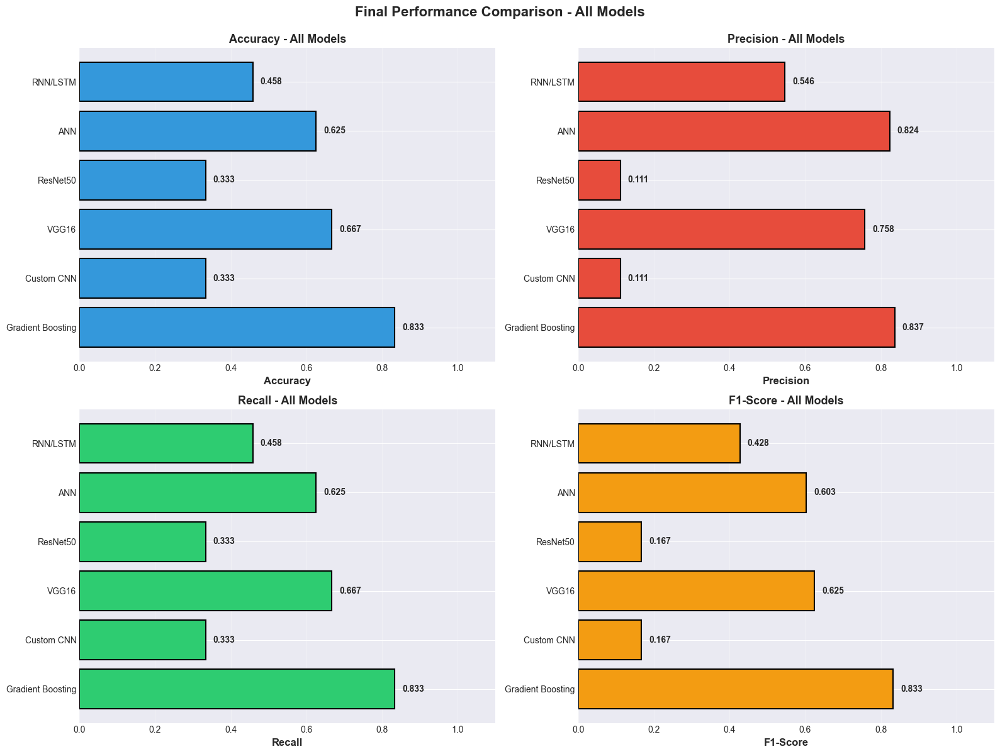

In [95]:
# Final Comparison Visualization
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

metrics = ['Accuracy', 'Precision', 'Recall', 'F1-Score']
colors_list = ['#3498db', '#e74c3c', '#2ecc71', '#f39c12']

for idx, (ax, metric, color) in enumerate(zip(axes.flatten(), metrics, colors_list)):
    bars = ax.barh(final_df['Model'], final_df[metric], color=color, 
                   edgecolor='black', linewidth=1.5)
    ax.set_xlabel(metric, fontsize=12, fontweight='bold')
    ax.set_title(f'{metric} - All Models', fontsize=13, fontweight='bold')
    ax.set_xlim([0, 1.1])
    ax.grid(axis='x', alpha=0.3)
    
    for i, bar in enumerate(bars):
        width = bar.get_width()
        ax.text(width + 0.02, bar.get_y() + bar.get_height()/2,
               f'{width:.3f}', ha='left', va='center', fontsize=10, fontweight='bold')

plt.suptitle('Final Performance Comparison - All Models', fontsize=16, fontweight='bold', y=0.995)
plt.tight_layout()
plt.show()

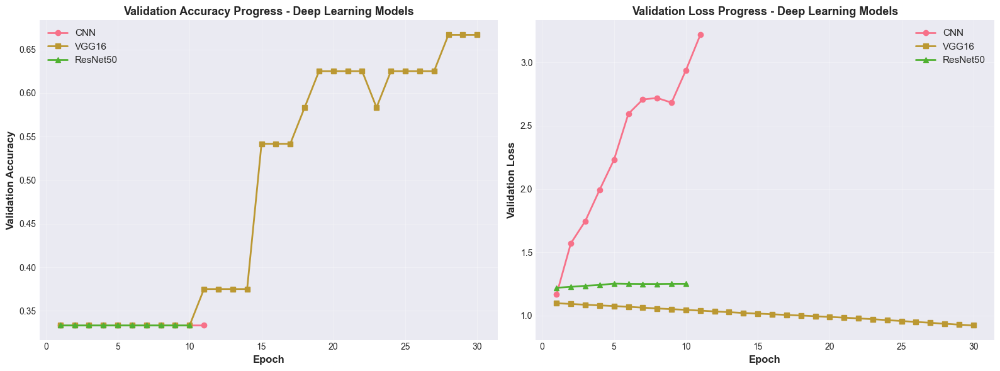

In [96]:
# Training Progress Comparison (DL Models)
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Validation Accuracy
epochs_cnn = range(1, len(history_cnn.history['val_accuracy']) + 1)
epochs_vgg = range(1, len(history_vgg16.history['val_accuracy']) + 1)
epochs_resnet = range(1, len(history_resnet.history['val_accuracy']) + 1)

ax1.plot(epochs_cnn, history_cnn.history['val_accuracy'], label='CNN', linewidth=2, marker='o')
ax1.plot(epochs_vgg, history_vgg16.history['val_accuracy'], label='VGG16', linewidth=2, marker='s')
ax1.plot(epochs_resnet, history_resnet.history['val_accuracy'], label='ResNet50', linewidth=2, marker='^')
ax1.set_xlabel('Epoch', fontsize=12, fontweight='bold')
ax1.set_ylabel('Validation Accuracy', fontsize=12, fontweight='bold')
ax1.set_title('Validation Accuracy Progress - Deep Learning Models', fontsize=13, fontweight='bold')
ax1.legend(fontsize=11)
ax1.grid(alpha=0.3)

# Validation Loss
ax2.plot(epochs_cnn, history_cnn.history['val_loss'], label='CNN', linewidth=2, marker='o')
ax2.plot(epochs_vgg, history_vgg16.history['val_loss'], label='VGG16', linewidth=2, marker='s')
ax2.plot(epochs_resnet, history_resnet.history['val_loss'], label='ResNet50', linewidth=2, marker='^')
ax2.set_xlabel('Epoch', fontsize=12, fontweight='bold')
ax2.set_ylabel('Validation Loss', fontsize=12, fontweight='bold')
ax2.set_title('Validation Loss Progress - Deep Learning Models', fontsize=13, fontweight='bold')
ax2.legend(fontsize=11)
ax2.grid(alpha=0.3)

plt.tight_layout()
plt.show()

In [97]:
# Best Overall Model
best_overall_idx = final_df['Accuracy'].idxmax()
best_overall_model = final_df.loc[best_overall_idx, 'Model']
best_overall_acc = final_df.loc[best_overall_idx, 'Accuracy']

print(f"Model: {best_overall_model}")
print(f"Accuracy: {best_overall_acc:.4f} ({best_overall_acc*100:.2f}%)")
print(f"Precision: {final_df.loc[best_overall_idx, 'Precision']:.4f}")
print(f"Recall: {final_df.loc[best_overall_idx, 'Recall']:.4f}")
print(f"F1-Score: {final_df.loc[best_overall_idx, 'F1-Score']:.4f}")

Model: Gradient Boosting
Accuracy: 0.8333 (83.33%)
Precision: 0.8366
Recall: 0.8333
F1-Score: 0.8328


# Prediction Examples and Visualization

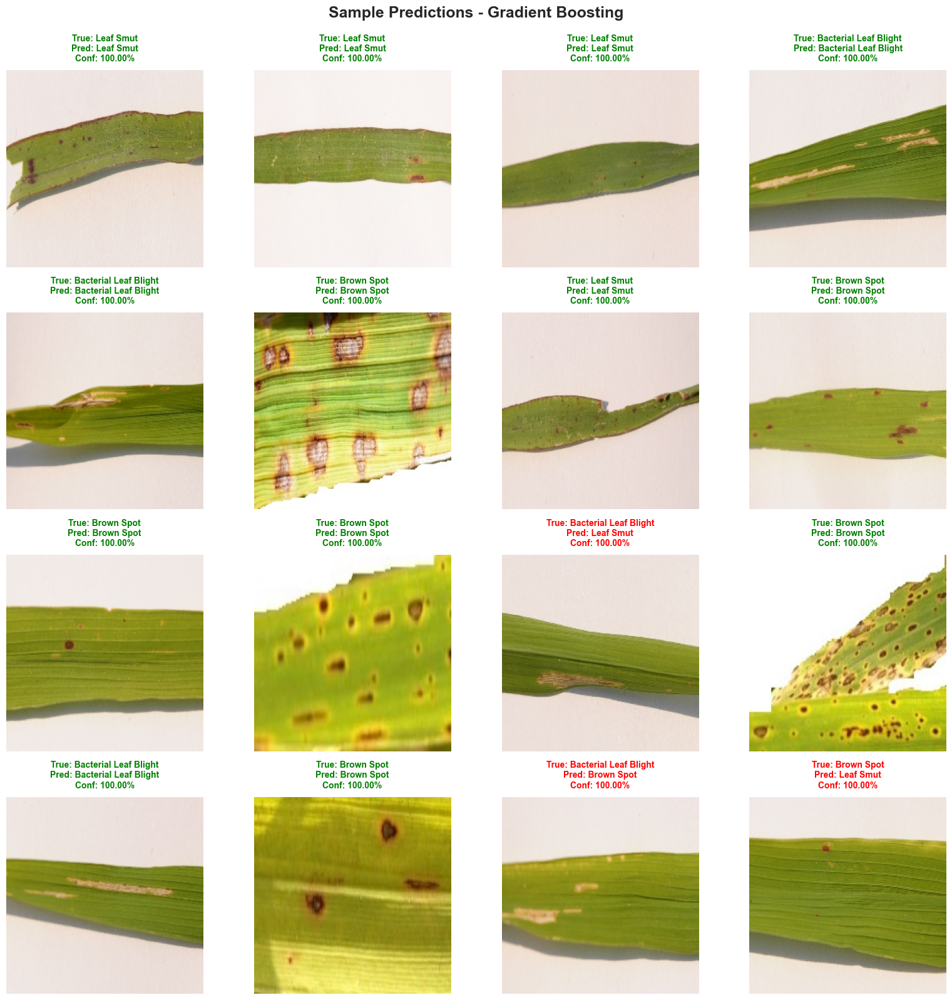

In [98]:
# Visualize Predictions
fig, axes = plt.subplots(4, 4, figsize=(16, 16))
fig.suptitle(f'Sample Predictions - {best_overall_model}', fontsize=18, fontweight='bold', y=0.995)

sample_indices = np.random.choice(len(X_img_test), 16, replace=False)

for idx, sample_idx in enumerate(sample_indices):
    row = idx // 4
    col = idx % 4
    
    # Display image
    axes[row, col].imshow(X_img_test[sample_idx])
    axes[row, col].axis('off')
    
    # Get prediction
    if 'CNN' in best_overall_model or 'VGG' in best_overall_model or 'ResNet' in best_overall_model:
        pred_probs = cnn_model.predict(X_img_test_norm[sample_idx:sample_idx+1], verbose=0)
        pred = np.argmax(pred_probs)
        confidence = pred_probs[0][pred]
    else:
        pred = best_model.predict(scaler.transform(extract_features(X_img_test[sample_idx:sample_idx+1])))[0]
        confidence = 1.0  # ML models don't provide probability by default
    
    true_label = y_img_test[sample_idx]
    
    # Color based on correctness
    color = 'green' if pred == true_label else 'red'
    
    axes[row, col].set_title(
        f'True: {class_names[true_label]}\nPred: {class_names[pred]}\nConf: {confidence:.2%}',
        fontsize=10,
        color=color,
        fontweight='bold',
        pad=10
    )

plt.tight_layout()
plt.show()

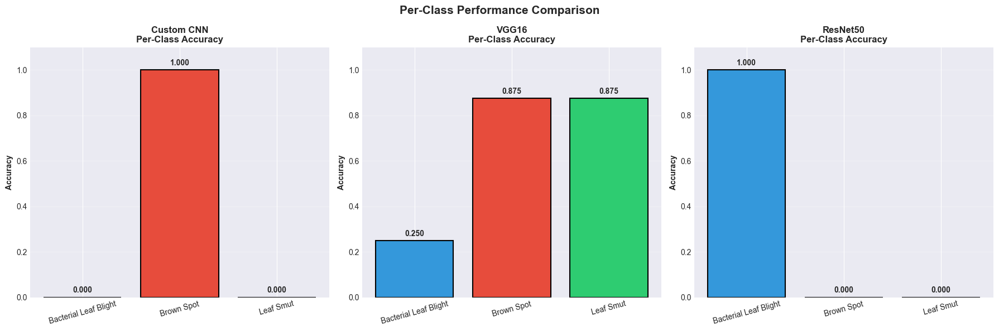

In [99]:
# Per-Class Performance Analysis
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

for idx, model_name in enumerate(['Custom CNN', 'VGG16', 'ResNet50']):
    if model_name == 'Custom CNN':
        y_pred = y_pred_cnn_classes
    elif model_name == 'VGG16':
        y_pred = y_pred_vgg16_classes
    else:
        y_pred = y_pred_resnet_classes
    
    # Calculate per-class metrics
    class_accuracies = []
    for i in range(3):
        mask = y_img_test == i
        class_acc = accuracy_score(y_img_test[mask], y_pred[mask])
        class_accuracies.append(class_acc)
    
    axes[idx].bar(class_names, class_accuracies, 
                  color=['#3498db', '#e74c3c', '#2ecc71'],
                  edgecolor='black', linewidth=1.5)
    axes[idx].set_title(f'{model_name}\nPer-Class Accuracy', fontsize=12, fontweight='bold')
    axes[idx].set_ylabel('Accuracy', fontweight='bold')
    axes[idx].set_ylim([0, 1.1])
    axes[idx].grid(axis='y', alpha=0.3)
    axes[idx].tick_params(axis='x', rotation=15)
    
    # Add value labels
    for i, v in enumerate(class_accuracies):
        axes[idx].text(i, v + 0.02, f'{v:.3f}', ha='center', fontweight='bold')

plt.suptitle('Per-Class Performance Comparison', fontsize=15, fontweight='bold')
plt.tight_layout()
plt.show()

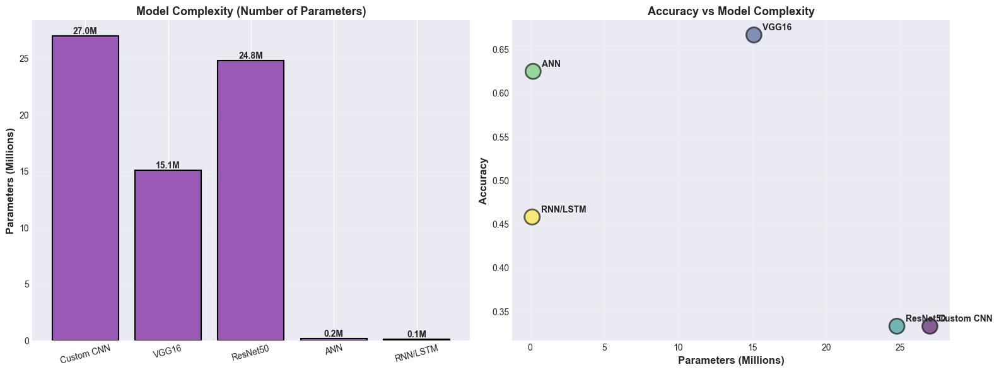

In [100]:
# Model Size and Complexity Comparison
model_info = {
    'Model': ['Custom CNN', 'VGG16', 'ResNet50', 'ANN', 'RNN/LSTM'],
    'Parameters': [
        cnn_model.count_params(),
        vgg16_model.count_params(),
        resnet_model.count_params(),
        ann_model.count_params(),
        rnn_model.count_params()
    ],
    'Accuracy': [cnn_acc, vgg_acc, resnet_acc, ann_acc, rnn_acc]
}

model_info_df = pd.DataFrame(model_info)
model_info_df['Parameters (M)'] = model_info_df['Parameters'] / 1e6

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Parameters comparison
bars1 = ax1.bar(model_info_df['Model'], model_info_df['Parameters (M)'],
                color='#9b59b6', edgecolor='black', linewidth=1.5)
ax1.set_ylabel('Parameters (Millions)', fontsize=12, fontweight='bold')
ax1.set_title('Model Complexity (Number of Parameters)', fontsize=13, fontweight='bold')
ax1.tick_params(axis='x', rotation=15)
ax1.grid(axis='y', alpha=0.3)

for i, bar in enumerate(bars1):
    height = bar.get_height()
    ax1.text(bar.get_x() + bar.get_width()/2., height,
            f'{height:.1f}M', ha='center', va='bottom', fontweight='bold')

# Accuracy vs Parameters
ax2.scatter(model_info_df['Parameters (M)'], model_info_df['Accuracy'],
           s=300, alpha=0.6, c=range(len(model_info_df)), cmap='viridis',
           edgecolors='black', linewidth=2)

for idx, row in model_info_df.iterrows():
    ax2.annotate(row['Model'], 
                (row['Parameters (M)'], row['Accuracy']),
                xytext=(10, 5), textcoords='offset points',
                fontsize=10, fontweight='bold')

ax2.set_xlabel('Parameters (Millions)', fontsize=12, fontweight='bold')
ax2.set_ylabel('Accuracy', fontsize=12, fontweight='bold')
ax2.set_title('Accuracy vs Model Complexity', fontsize=13, fontweight='bold')
ax2.grid(alpha=0.3)

plt.tight_layout()
plt.show()

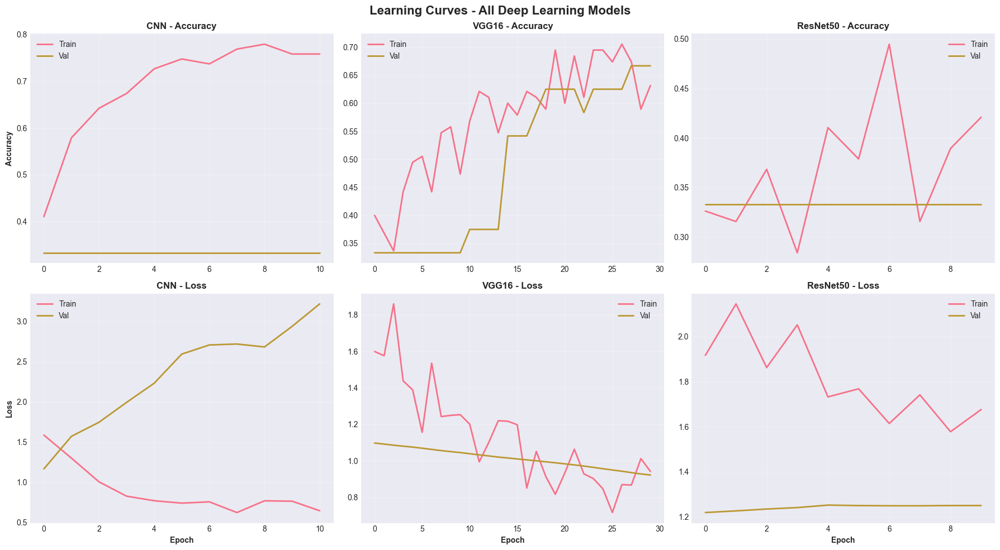

In [101]:
# Learning Curves Analysis
fig, axes = plt.subplots(2, 3, figsize=(18, 10))
fig.suptitle('Learning Curves - All Deep Learning Models', fontsize=16, fontweight='bold')

# CNN
axes[0, 0].plot(history_cnn.history['accuracy'], label='Train', linewidth=2)
axes[0, 0].plot(history_cnn.history['val_accuracy'], label='Val', linewidth=2)
axes[0, 0].set_title('CNN - Accuracy', fontweight='bold')
axes[0, 0].set_ylabel('Accuracy', fontweight='bold')
axes[0, 0].legend()
axes[0, 0].grid(alpha=0.3)

axes[1, 0].plot(history_cnn.history['loss'], label='Train', linewidth=2)
axes[1, 0].plot(history_cnn.history['val_loss'], label='Val', linewidth=2)
axes[1, 0].set_title('CNN - Loss', fontweight='bold')
axes[1, 0].set_ylabel('Loss', fontweight='bold')
axes[1, 0].set_xlabel('Epoch', fontweight='bold')
axes[1, 0].legend()
axes[1, 0].grid(alpha=0.3)

# VGG16
axes[0, 1].plot(history_vgg16.history['accuracy'], label='Train', linewidth=2)
axes[0, 1].plot(history_vgg16.history['val_accuracy'], label='Val', linewidth=2)
axes[0, 1].set_title('VGG16 - Accuracy', fontweight='bold')
axes[0, 1].legend()
axes[0, 1].grid(alpha=0.3)

axes[1, 1].plot(history_vgg16.history['loss'], label='Train', linewidth=2)
axes[1, 1].plot(history_vgg16.history['val_loss'], label='Val', linewidth=2)
axes[1, 1].set_title('VGG16 - Loss', fontweight='bold')
axes[1, 1].set_xlabel('Epoch', fontweight='bold')
axes[1, 1].legend()
axes[1, 1].grid(alpha=0.3)

# ResNet50
axes[0, 2].plot(history_resnet.history['accuracy'], label='Train', linewidth=2)
axes[0, 2].plot(history_resnet.history['val_accuracy'], label='Val', linewidth=2)
axes[0, 2].set_title('ResNet50 - Accuracy', fontweight='bold')
axes[0, 2].legend()
axes[0, 2].grid(alpha=0.3)

axes[1, 2].plot(history_resnet.history['loss'], label='Train', linewidth=2)
axes[1, 2].plot(history_resnet.history['val_loss'], label='Val', linewidth=2)
axes[1, 2].set_title('ResNet50 - Loss', fontweight='bold')
axes[1, 2].set_xlabel('Epoch', fontweight='bold')
axes[1, 2].legend()
axes[1, 2].grid(alpha=0.3)

plt.tight_layout()
plt.show()

In [102]:
# ROC Curve Analysis (for CNN)
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
from itertools import cycle

In [103]:
# Binarize the output
y_test_bin = label_binarize(y_img_test, classes=[0, 1, 2])
n_classes = 3

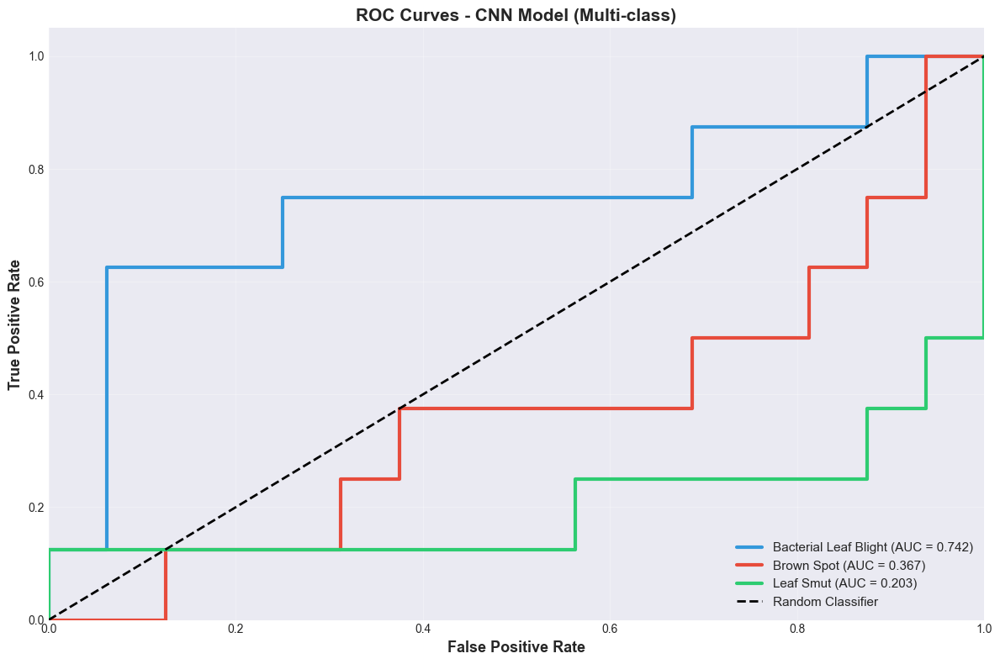

In [104]:
# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_pred_cnn[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Plot ROC curves
plt.figure(figsize=(12, 8))
colors = cycle(['#3498db', '#e74c3c', '#2ecc71'])

for i, color, class_name in zip(range(n_classes), colors, class_names):
    plt.plot(fpr[i], tpr[i], color=color, linewidth=3,
             label=f'{class_name} (AUC = {roc_auc[i]:.3f})')

plt.plot([0, 1], [0, 1], 'k--', linewidth=2, label='Random Classifier')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate', fontsize=13, fontweight='bold')
plt.ylabel('True Positive Rate', fontsize=13, fontweight='bold')
plt.title('ROC Curves - CNN Model (Multi-class)', fontsize=15, fontweight='bold')
plt.legend(loc="lower right", fontsize=11)
plt.grid(alpha=0.3)
plt.tight_layout()
plt.show()

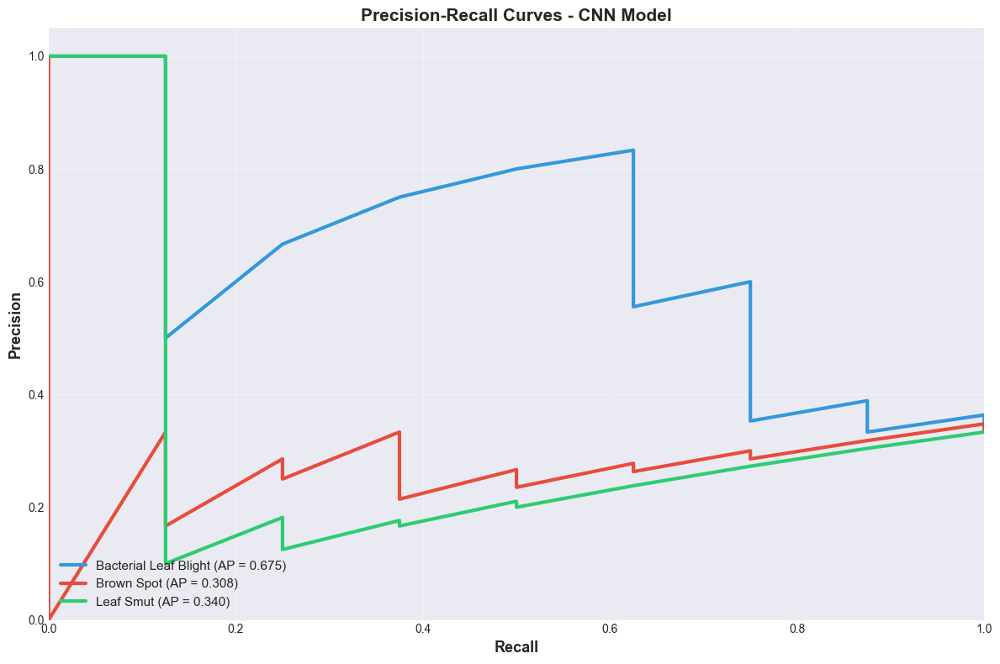

In [105]:
# Precision-Recall Curve
from sklearn.metrics import precision_recall_curve, average_precision_score

precision = dict()
recall = dict()
avg_precision = dict()

for i in range(n_classes):
    precision[i], recall[i], _ = precision_recall_curve(y_test_bin[:, i], y_pred_cnn[:, i])
    avg_precision[i] = average_precision_score(y_test_bin[:, i], y_pred_cnn[:, i])

plt.figure(figsize=(12, 8))
colors = cycle(['#3498db', '#e74c3c', '#2ecc71'])

for i, color, class_name in zip(range(n_classes), colors, class_names):
    plt.plot(recall[i], precision[i], color=color, linewidth=3,
             label=f'{class_name} (AP = {avg_precision[i]:.3f})')

plt.xlabel('Recall', fontsize=13, fontweight='bold')
plt.ylabel('Precision', fontsize=13, fontweight='bold')
plt.title('Precision-Recall Curves - CNN Model', fontsize=15, fontweight='bold')
plt.legend(loc="lower left", fontsize=11)
plt.grid(alpha=0.3)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.tight_layout()
plt.show()

In [106]:
# Summary Statistics Table
summary_stats = []

for i, class_name in enumerate(class_names):
    class_mask = y_img_test == i
    class_size = np.sum(class_mask)
    
    # CNN predictions for this class
    cnn_correct = np.sum((y_pred_cnn_classes[class_mask] == i))
    cnn_acc = cnn_correct / class_size
    
    summary_stats.append({
        'Class': class_name,
        'Samples': class_size,
        'CNN Accuracy': f'{cnn_acc:.2%}',
        'Correct Predictions': cnn_correct
    })

In [107]:
summary_df = pd.DataFrame(summary_stats)
print(summary_df.to_string(index=False))

                Class  Samples CNN Accuracy  Correct Predictions
Bacterial Leaf Blight        8        0.00%                    0
           Brown Spot        8      100.00%                    8
            Leaf Smut        8        0.00%                    0
